# Spark DataFrame

Although RDD is the core API of Apache Spark, it is no longer the recommended API to use. In its place is the Dataset, which is a typed version of RDD. This allows optimization based on the data type of a Dataset's content. However, since Python does not have static typing, Datasets are not directly used in Python. Instead, we work with higher-level Spark DataFrames.

Spark DataFrames are created from a `SparkSession`.

In [1]:
from pyspark.sql import SparkSession

In [2]:
spark = (SparkSession
     .builder
     .master('local[*]')
     .getOrCreate())

22/01/31 22:44:48 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
22/01/31 22:44:49 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


It can be created from an existing `SparkContext` as well.

## Working with CSV files

In this example, we work with the New York City green taxi data for the last quarter of 2017.

In [3]:
trips = spark.read.csv(
    '/mnt/data/public/nyctaxi/all/green_tripdata_2017-1*.csv',
    sep=',', header=True
)

Spark dataframes are similar to pandas data frames. For example, the names of columns can be retrieved in the same manner.

In [4]:
trips.columns

['VendorID',
 'lpep_pickup_datetime',
 'lpep_dropoff_datetime',
 'store_and_fwd_flag',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'passenger_count',
 'trip_distance',
 'fare_amount',
 'extra',
 'mta_tax',
 'tip_amount',
 'tolls_amount',
 'ehail_fee',
 'improvement_surcharge',
 'total_amount',
 'payment_type',
 'trip_type']

In [5]:
trips.show()

+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|VendorID|lpep_pickup_datetime|lpep_dropoff_datetime|store_and_fwd_flag|RatecodeID|PULocationID|DOLocationID|passenger_count|trip_distance|fare_amount|extra|mta_tax|tip_amount|tolls_amount|ehail_fee|improvement_surcharge|total_amount|payment_type|trip_type|
+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|       2| 2017-10-01 00:27:41|  2017-10-01 00:32:45|                 N|         1|         264|         193|              1|          .00|        2.5|  0.5|    0.5|         0|           0|     null|                  0.3|     

However, indexing the Spark data frame with a column won't return the contents of a column. There is also no index.

In [6]:
trips['VendorID']

Column<'VendorID'>

In [7]:
trips.VendorID

Column<'VendorID'>

The data type of each column is determined based on reading a few rows of the data frame. The detected columns and their data types can be displayed using `printSchema`.

In [8]:
trips.printSchema()

root
 |-- VendorID: string (nullable = true)
 |-- lpep_pickup_datetime: string (nullable = true)
 |-- lpep_dropoff_datetime: string (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- RatecodeID: string (nullable = true)
 |-- PULocationID: string (nullable = true)
 |-- DOLocationID: string (nullable = true)
 |-- passenger_count: string (nullable = true)
 |-- trip_distance: string (nullable = true)
 |-- fare_amount: string (nullable = true)
 |-- extra: string (nullable = true)
 |-- mta_tax: string (nullable = true)
 |-- tip_amount: string (nullable = true)
 |-- tolls_amount: string (nullable = true)
 |-- ehail_fee: string (nullable = true)
 |-- improvement_surcharge: string (nullable = true)
 |-- total_amount: string (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- trip_type: string (nullable = true)



The schema can also be explicitly specified following a SQL format.

In [9]:
schema = """
VendorID INT,
lpep_pickup_datetime TIMESTAMP,
lpep_dropoff_datetime TIMESTAMP,
store_and_fwd_flag INT,
RatecodeID INT,
PULocationID INT,
DOLocationID INT,
passenger_count INT,
trip_distance FLOAT,
fare_amount FLOAT,
extra FLOAT,
mta_tax FLOAT,
tip_amount FLOAT,
tolls_amount FLOAT,
ehail_fee FLOAT,
improvement_surcharge FLOAT,
total_amount FLOAT,
payment_type STRING,
trip_type STRING
"""
trips = spark.read.csv(
    '/mnt/data/public/nyctaxi/all/green_tripdata_2017-1*.csv',
    sep=',', header=True,
    schema=schema
)

In [10]:
trips.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- lpep_pickup_datetime: timestamp (nullable = true)
 |-- lpep_dropoff_datetime: timestamp (nullable = true)
 |-- store_and_fwd_flag: integer (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: float (nullable = true)
 |-- fare_amount: float (nullable = true)
 |-- extra: float (nullable = true)
 |-- mta_tax: float (nullable = true)
 |-- tip_amount: float (nullable = true)
 |-- tolls_amount: float (nullable = true)
 |-- ehail_fee: float (nullable = true)
 |-- improvement_surcharge: float (nullable = true)
 |-- total_amount: float (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- trip_type: string (nullable = true)



In [11]:
trips.limit(10).toPandas()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
0,2,2017-10-01 00:27:41,2017-10-01 00:32:45,NaN,1,264,193,1,0.00,2.5,0.5,0.5,0.00,0.00,NaN,0.3,3.800000,2,1
1,2,2017-10-01 00:56:00,2017-10-01 01:21:49,NaN,1,92,230,1,13.98,40.0,0.5,0.5,9.41,5.76,NaN,0.3,56.470001,1,1
2,2,2017-10-01 00:27:48,2017-10-01 00:36:48,NaN,1,112,157,1,1.61,8.0,0.5,0.5,0.00,0.00,NaN,0.3,9.300000,2,1
3,2,2017-10-01 00:24:24,2017-10-01 00:55:38,NaN,1,255,48,2,7.23,26.0,0.5,0.5,0.00,0.00,NaN,0.3,27.299999,2,1
4,2,2017-10-01 00:24:11,2017-10-01 00:36:27,NaN,1,260,129,1,2.31,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1
5,2,2017-10-01 00:42:13,2017-10-01 00:56:51,NaN,1,129,129,1,1.30,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1
6,2,2017-10-01 00:18:55,2017-10-01 00:23:07,NaN,1,97,49,1,0.89,5.5,0.5,0.5,0.00,0.00,NaN,0.3,6.800000,1,1
7,2,2017-10-01 00:44:16,2017-10-01 00:58:16,NaN,1,255,37,1,1.95,11.0,0.5,0.5,2.50,0.00,NaN,0.3,14.800000,1,1
8,1,2017-10-01 00:44:02,2017-10-01 01:01:36,NaN,1,106,79,1,5.70,19.0,0.5,0.5,5.05,0.00,NaN,0.3,25.350000,1,1
9,1,2017-10-01 00:12:11,2017-10-01 00:22:06,NaN,1,7,223,1,1.70,9.0,0.5,0.5,2.05,0.00,NaN,0.3,12.350000,1,1


To know the number of rows, `count` can be used.

In [12]:
trips.count()

2706150

We will see later in this notebook, how to access the contents of a column.

Spark dataframes are actually Datasets of `Row`s (`Dataset[Row]`). This is clearly seen when we retrieve the first element of the underlying RDD.

In [13]:
trips.first()

Row(VendorID=2, lpep_pickup_datetime=datetime.datetime(2017, 10, 1, 0, 27, 41), lpep_dropoff_datetime=datetime.datetime(2017, 10, 1, 0, 32, 45), store_and_fwd_flag=None, RatecodeID=1, PULocationID=264, DOLocationID=193, passenger_count=1, trip_distance=0.0, fare_amount=2.5, extra=0.5, mta_tax=0.5, tip_amount=0.0, tolls_amount=0.0, ehail_fee=None, improvement_surcharge=0.30000001192092896, total_amount=3.799999952316284, payment_type='2', trip_type='1')

`Row`s can be indexed by column name or position as well as by attribute lookup.

In [14]:
trips.first()[0]

2

In [15]:
trips.first()['VendorID']

2

In [16]:
trips.first().VendorID

2

One way of creating a Spark dataframe is to create it from an RDD of `Row`s.

In [17]:
from pyspark import Row

(spark.createDataFrame(
    [
        Row(a=1, b=2, c=3),
        Row(a=4, b=5, c=6)
    ]
)
    .show())

+---+---+---+
|  a|  b|  c|
+---+---+---+
|  1|  2|  3|
|  4|  5|  6|
+---+---+---+



A Spark data frame can also be created from a pandas data frame.

In [18]:
import pandas as pd
pdf = pd.DataFrame({
    'a': [1, 4],
    'b': [2, 5],
    'c': [3, 6]
})
pdf

,a,b,c
0,1,2,3
1,4,5,6


In [19]:
(spark
    .createDataFrame(pdf)
    .show())

+---+---+---+
|  a|  b|  c|
+---+---+---+
|  1|  2|  3|
|  4|  5|  6|
+---+---+---+



A way to display the contents of a dataframe is by calling `show`.

In [20]:
trips.show()

+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|VendorID|lpep_pickup_datetime|lpep_dropoff_datetime|store_and_fwd_flag|RatecodeID|PULocationID|DOLocationID|passenger_count|trip_distance|fare_amount|extra|mta_tax|tip_amount|tolls_amount|ehail_fee|improvement_surcharge|total_amount|payment_type|trip_type|
+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|       2| 2017-10-01 00:27:41|  2017-10-01 00:32:45|              null|         1|         264|         193|              1|          0.0|        2.5|  0.5|    0.5|       0.0|         0.0|     null|                  0.3|     

By default, `show` will only display the first 20 rows. To change the number of rows to display, pass the value to `show`.

In [21]:
trips.show(10)

+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|VendorID|lpep_pickup_datetime|lpep_dropoff_datetime|store_and_fwd_flag|RatecodeID|PULocationID|DOLocationID|passenger_count|trip_distance|fare_amount|extra|mta_tax|tip_amount|tolls_amount|ehail_fee|improvement_surcharge|total_amount|payment_type|trip_type|
+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+
|       2| 2017-10-01 00:27:41|  2017-10-01 00:32:45|              null|         1|         264|         193|              1|          0.0|        2.5|  0.5|    0.5|       0.0|         0.0|     null|                  0.3|     

You may also convert the data frame into pandas--only if it fits in the driver's memory.

In [22]:
trips.limit(10).toPandas()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
0,2,2017-10-01 00:27:41,2017-10-01 00:32:45,NaN,1,264,193,1,0.00,2.5,0.5,0.5,0.00,0.00,NaN,0.3,3.800000,2,1
1,2,2017-10-01 00:56:00,2017-10-01 01:21:49,NaN,1,92,230,1,13.98,40.0,0.5,0.5,9.41,5.76,NaN,0.3,56.470001,1,1
2,2,2017-10-01 00:27:48,2017-10-01 00:36:48,NaN,1,112,157,1,1.61,8.0,0.5,0.5,0.00,0.00,NaN,0.3,9.300000,2,1
3,2,2017-10-01 00:24:24,2017-10-01 00:55:38,NaN,1,255,48,2,7.23,26.0,0.5,0.5,0.00,0.00,NaN,0.3,27.299999,2,1
4,2,2017-10-01 00:24:11,2017-10-01 00:36:27,NaN,1,260,129,1,2.31,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1
5,2,2017-10-01 00:42:13,2017-10-01 00:56:51,NaN,1,129,129,1,1.30,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1
6,2,2017-10-01 00:18:55,2017-10-01 00:23:07,NaN,1,97,49,1,0.89,5.5,0.5,0.5,0.00,0.00,NaN,0.3,6.800000,1,1
7,2,2017-10-01 00:44:16,2017-10-01 00:58:16,NaN,1,255,37,1,1.95,11.0,0.5,0.5,2.50,0.00,NaN,0.3,14.800000,1,1
8,1,2017-10-01 00:44:02,2017-10-01 01:01:36,NaN,1,106,79,1,5.70,19.0,0.5,0.5,5.05,0.00,NaN,0.3,25.350000,1,1
9,1,2017-10-01 00:12:11,2017-10-01 00:22:06,NaN,1,7,223,1,1.70,9.0,0.5,0.5,2.05,0.00,NaN,0.3,12.350000,1,1


Notice the use of `limit`. There's no slicing, `loc` nor `iloc`.

To access the underlying RDD, call the `rdd` attribute.

In [23]:
trips.rdd.getNumPartitions()

4

To display expanded summary statistics of the dataframe, call `summary`.

In [24]:
trips.summary().show()

+-------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+---------+---------------------+------------------+------------------+-------------------+
|summary|          VendorID|store_and_fwd_flag|        RatecodeID|      PULocationID|      DOLocationID|   passenger_count|     trip_distance|       fare_amount|              extra|            mta_tax|        tip_amount|       tolls_amount|ehail_fee|improvement_surcharge|      total_amount|      payment_type|          trip_type|
+-------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+---------+---------------------+------------------+------------------+-------------------+
|  coun

In [25]:
trips.describe().toPandas()

,summary,VendorID,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
0,count,2706150,0,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,0,2706150,2706150,2706150,2706148
1,mean,1.81975389390832,None,1.0722402675387543,111.30347985144948,129.15571198935757,1.368335458123164,2.7114804943938404,12.019024617951496,0.3403455758181679,0.4884111486798527,1.0992262803840853,0.11599079474719991,None,0.2933357469257784,14.379970184281774,1.4848574543170185,1.0172754779117772
2,stddev,0.3843923801678409,None,0.5290499752116313,75.18647090495355,76.99338288273817,1.0493454879969992,2.8728002315368815,10.500908235626582,0.38978678268512895,0.08244890484349743,1.9847368230911955,1.464431874700413,None,0.04865246657163179,11.614365884082604,0.5224361324427713,0.13029597863405024
3,min,1,None,1,1,1,0,0.0,-400.09,-4.5,-0.5,-88.8,-5.76,None,-0.3,-400.09,1,1
4,max,2,None,99,265,265,9,220.08,6003.5,30.0,0.83,290.0,499.95,None,0.3,6004.3,5,2


In [26]:
trips.summary().toPandas()

,summary,VendorID,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
0,count,2706150,0,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,2706150,0,2706150,2706150,2706150,2706148
1,mean,1.81975389390832,None,1.0722402675387543,111.30347985144948,129.15571198935757,1.368335458123164,2.7114804943938404,12.019024617951496,0.3403455758181679,0.4884111486798527,1.0992262803840853,0.11599079474719991,None,0.2933357469257784,14.379970184281774,1.4848574543170185,1.0172754779117772
2,stddev,0.3843923801678409,None,0.5290499752116313,75.18647090495355,76.99338288273817,1.0493454879969992,2.8728002315368815,10.500908235626582,0.38978678268512895,0.08244890484349743,1.9847368230911955,1.464431874700413,None,0.04865246657163179,11.614365884082604,0.5224361324427713,0.13029597863405024
3,min,1,None,1,1,1,0,0.0,-400.09,-4.5,-0.5,-88.8,-5.76,None,-0.3,-400.09,1,1
4,25%,2,None,1,49,62,1,1.0,6.0,0.0,0.5,0.0,0.0,None,0.3,7.8,1.0,1.0
5,50%,2,None,1,82,129,1,1.75,9.0,0.5,0.5,0.0,0.0,None,0.3,11.16,1.0,1.0
6,75%,2,None,1,166,193,1,3.33,14.5,0.5,0.5,1.86,0.0,None,0.3,17.16,2.0,1.0
7,max,2,None,99,265,265,9,220.08,6003.5,30.0,0.83,290.0,499.95,None,0.3,6004.3,5,2


In [27]:
trips.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- lpep_pickup_datetime: timestamp (nullable = true)
 |-- lpep_dropoff_datetime: timestamp (nullable = true)
 |-- store_and_fwd_flag: integer (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: float (nullable = true)
 |-- fare_amount: float (nullable = true)
 |-- extra: float (nullable = true)
 |-- mta_tax: float (nullable = true)
 |-- tip_amount: float (nullable = true)
 |-- tolls_amount: float (nullable = true)
 |-- ehail_fee: float (nullable = true)
 |-- improvement_surcharge: float (nullable = true)
 |-- total_amount: float (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- trip_type: string (nullable = true)



We can also display selected columns.

In [28]:
trips.select('PULocationID').show()

+------------+
|PULocationID|
+------------+
|         264|
|          92|
|         112|
|         255|
|         260|
|         129|
|          97|
|         255|
|         106|
|           7|
|         223|
|          49|
|          25|
|          25|
|         179|
|         179|
|         112|
|         112|
|         256|
|         260|
+------------+
only showing top 20 rows



In [29]:
trips.select('PULocationID', 'DOLocationID').show()

+------------+------------+
|PULocationID|DOLocationID|
+------------+------------+
|         264|         193|
|          92|         230|
|         112|         157|
|         255|          48|
|         260|         129|
|         129|         129|
|          97|          49|
|         255|          37|
|         106|          79|
|           7|         223|
|         223|           7|
|          49|         233|
|          25|          49|
|          25|          33|
|         179|         260|
|         179|         179|
|         112|         112|
|         112|          49|
|         256|          79|
|         260|         198|
+------------+------------+
only showing top 20 rows



In [30]:
trips.describe('PULocationID', 'DOLocationID').show()

+-------+------------------+------------------+
|summary|      PULocationID|      DOLocationID|
+-------+------------------+------------------+
|  count|           2706150|           2706150|
|   mean|111.30347985144948|129.15571198935757|
| stddev| 75.18647090495355| 76.99338288273817|
|    min|                 1|                 1|
|    max|               265|               265|
+-------+------------------+------------------+



We can filter for items that have at least a certain relative frequency (`support`).

In [31]:
trips.freqItems(['PULocationID'], 0.01).show()

+----------------------+
|PULocationID_freqItems|
+----------------------+
|  [146, 92, 173, 18...|
+----------------------+



In [32]:
trips.freqItems(['PULocationID', 'DOLocationID'], 0.01).show()

+----------------------+----------------------+
|PULocationID_freqItems|DOLocationID_freqItems|
+----------------------+----------------------+
|  [146, 92, 173, 18...|  [146, 92, 173, 83...|
+----------------------+----------------------+



We can display the frequent items as rows instead.

In [33]:
from pyspark.sql.functions import explode
(trips.freqItems(['PULocationID'], 0.01)
      .withColumn('freq_items', explode('PULocationID_freqItems'))
      .drop('PULocationID_freqItems')
      .show())

+----------+
|freq_items|
+----------+
|       146|
|        92|
|       173|
|       182|
|        83|
|       236|
|        95|
|       167|
|        41|
|       149|
|        62|
|       134|
|        35|
|        17|
|        26|
|        80|
|        89|
|       116|
|        71|
|        74|
+----------+
only showing top 20 rows



If we want to get the frequency count of a column, we can do something like the following cell.

In [34]:
from pyspark.sql.functions import explode, desc
(trips.groupby(trips['PULocationID'])
      .count()
      .orderBy(desc('count'))
      .show())

+------------+------+
|PULocationID| count|
+------------+------+
|          74|167207|
|          41|150186|
|          75|149227|
|           7|137966|
|          82|127071|
|         166|114460|
|         255| 92982|
|          42| 88615|
|         181| 87262|
|          97| 84196|
|         129| 76111|
|          33| 73776|
|          95| 71792|
|          25| 69632|
|          65| 65991|
|         244| 64260|
|         260| 59804|
|          66| 54805|
|         223| 54271|
|         116| 39841|
+------------+------+
only showing top 20 rows



In [35]:
from pyspark.sql.functions import monotonically_increasing_id
trips_with_id = trips.withColumn('id', monotonically_increasing_id())
(trips_with_id
     .limit(100)
     .toPandas())

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,id
0,2,2017-10-01 00:27:41,2017-10-01 00:32:45,NaN,1,264,193,1,0.00,2.5,0.5,0.5,0.00,0.00,NaN,0.3,3.800000,2,1,0
1,2,2017-10-01 00:56:00,2017-10-01 01:21:49,NaN,1,92,230,1,13.98,40.0,0.5,0.5,9.41,5.76,NaN,0.3,56.470001,1,1,1
2,2,2017-10-01 00:27:48,2017-10-01 00:36:48,NaN,1,112,157,1,1.61,8.0,0.5,0.5,0.00,0.00,NaN,0.3,9.300000,2,1,2
3,2,2017-10-01 00:24:24,2017-10-01 00:55:38,NaN,1,255,48,2,7.23,26.0,0.5,0.5,0.00,0.00,NaN,0.3,27.299999,2,1,3
4,2,2017-10-01 00:24:11,2017-10-01 00:36:27,NaN,1,260,129,1,2.31,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2,2017-10-01 00:26:54,2017-10-01 00:31:21,NaN,1,145,193,1,0.73,5.0,0.5,0.5,0.00,0.00,NaN,0.3,6.300000,2,1,95
96,2,2017-10-01 00:46:33,2017-10-01 00:54:35,NaN,1,226,7,1,2.21,8.5,0.5,0.5,0.00,0.00,NaN,0.3,9.800000,2,1,96
97,1,2017-10-01 00:13:41,2017-10-01 00:32:13,NaN,1,97,79,1,3.00,14.5,0.5,0.5,0.00,0.00,NaN,0.3,15.800000,2,1,97
98,1,2017-10-01 00:58:47,2017-10-01 01:08:48,NaN,1,65,49,1,1.70,8.5,0.5,0.5,1.95,0.00,NaN,0.3,11.750000,1,1,98


In [36]:
(trips_with_id
    .orderBy('id')
    .limit(100)
    .toPandas())

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,id
0,2,2017-10-01 00:27:41,2017-10-01 00:32:45,NaN,1,264,193,1,0.00,2.5,0.5,0.5,0.00,0.00,NaN,0.3,3.800000,2,1,0
1,2,2017-10-01 00:56:00,2017-10-01 01:21:49,NaN,1,92,230,1,13.98,40.0,0.5,0.5,9.41,5.76,NaN,0.3,56.470001,1,1,1
2,2,2017-10-01 00:27:48,2017-10-01 00:36:48,NaN,1,112,157,1,1.61,8.0,0.5,0.5,0.00,0.00,NaN,0.3,9.300000,2,1,2
3,2,2017-10-01 00:24:24,2017-10-01 00:55:38,NaN,1,255,48,2,7.23,26.0,0.5,0.5,0.00,0.00,NaN,0.3,27.299999,2,1,3
4,2,2017-10-01 00:24:11,2017-10-01 00:36:27,NaN,1,260,129,1,2.31,10.5,0.5,0.5,0.00,0.00,NaN,0.3,11.800000,2,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2,2017-10-01 00:26:54,2017-10-01 00:31:21,NaN,1,145,193,1,0.73,5.0,0.5,0.5,0.00,0.00,NaN,0.3,6.300000,2,1,95
96,2,2017-10-01 00:46:33,2017-10-01 00:54:35,NaN,1,226,7,1,2.21,8.5,0.5,0.5,0.00,0.00,NaN,0.3,9.800000,2,1,96
97,1,2017-10-01 00:13:41,2017-10-01 00:32:13,NaN,1,97,79,1,3.00,14.5,0.5,0.5,0.00,0.00,NaN,0.3,15.800000,2,1,97
98,1,2017-10-01 00:58:47,2017-10-01 01:08:48,NaN,1,65,49,1,1.70,8.5,0.5,0.5,1.95,0.00,NaN,0.3,11.750000,1,1,98


Spark dataframes do not have visualization methods. They also do not have a histogram method so we convert them into an RDD then use its `histogram` method.

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-fpdz9zh1 because the default path (/home/jgacal/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


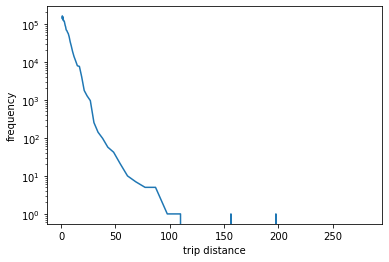

In [37]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
bins, freq = (trips.select(trips['trip_distance'].cast('float'))
                   .rdd
                   .map(lambda x: x.trip_distance)
                   .histogram(np.logspace(0, 2.5).tolist()))
plt.semilogy(bins[:-1], freq)
plt.xlabel('trip distance')
plt.ylabel('frequency');

As shown above, group by operations are supported as well.

In [38]:
(trips.withColumn('total_amount', trips.total_amount.cast('float'))
      .groupby('VendorID')
      .sum('total_amount')
      .describe()
      .show())

+-------+------------------+--------------------+
|summary|          VendorID|   sum(total_amount)|
+-------+------------------+--------------------+
|  count|                 2|                   2|
|   mean|               1.5| 1.945717815709706E7|
| stddev|0.7071067811865476|1.7996291301079992E7|
|    min|                 1|    6731878.54189492|
|    max|                 2|  3.21824777722992E7|
+-------+------------------+--------------------+



In [39]:
(trips.withColumn('total_amount', trips.total_amount.cast('float'))
      .groupby('VendorID')
      .count()
      .show())

+--------+-------+
|VendorID|  count|
+--------+-------+
|       1| 487773|
|       2|2218377|
+--------+-------+



## Working with Parquet files

The data files that we have worked so far, store data in a row layout. This makes it easy to access all the information in a record. However, in typical analytics workloads e.g., those done using pandas or Spark, we usually work on all of the rows of certain columns at the same time. It would be more efficient, therefore, to store data in a columnar fashion so that we can easily read data of a column.

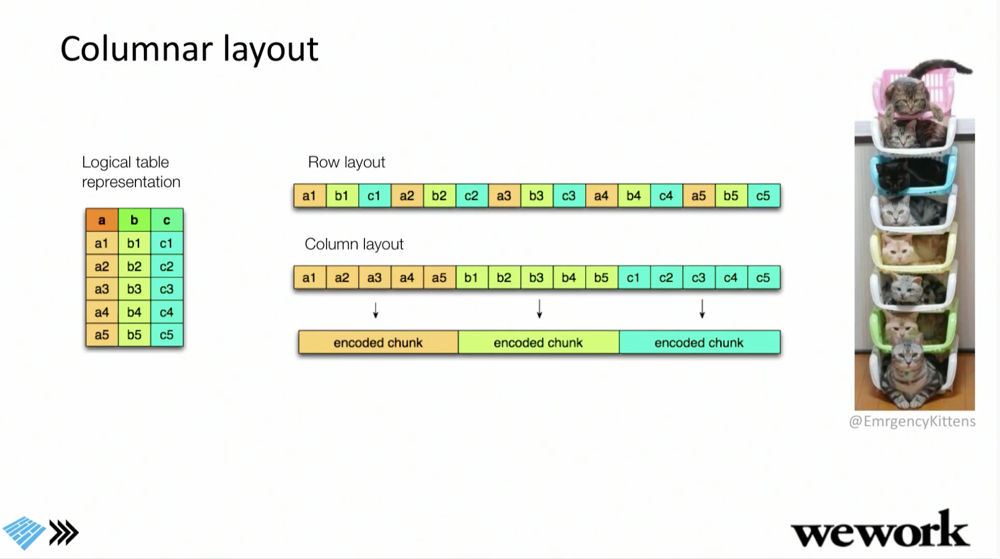

Apache Parquet is once such columnar format. It is supported by Spark and pandas, among others.
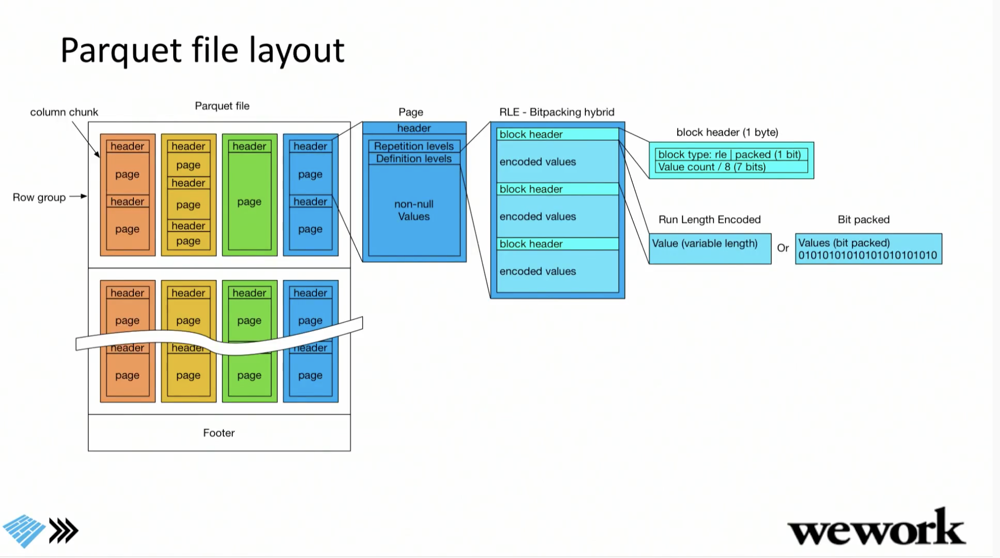

Instead of reading from CSV files, let's read from Parquet files instead.

In [40]:
trips = spark.read.parquet('/mnt/data/public/nyctaxi/green_2017')

When we read parquet files, **we are not referring to just one file but to a collection or directory of files.**

In [41]:
!ls -lr /mnt/data/public/nyctaxi/green_2017

total 452496
-rw-r--r-- 1 root root  32747302 Sep 30  2018 part.5.parquet
-rw-r--r-- 1 root root 122435279 Sep 30  2018 part.4.parquet
-rw-r--r-- 1 root root  27255730 Sep 30  2018 part.3.parquet
-rw-r--r-- 1 root root 122350070 Sep 30  2018 part.2.parquet
-rw-r--r-- 1 root root  36175284 Sep 30  2018 part.1.parquet
-rw-r--r-- 1 root root 122343660 Sep 30  2018 part.0.parquet
-rw-r--r-- 1 root root     14142 Sep 30  2018 _metadata
-rw-r--r-- 1 root root      2384 Sep 30  2018 _common_metadata


Parquet files can also be partitioned by columns which will result in a nested directory structure. Queries that filter on the partitioning columns will exploit the directory structure to prune files that have to be read.

In [42]:
!ls -lR /mnt/data/public/nyctaxi/green_2017_partitioned/

/mnt/data/public/nyctaxi/green_2017_partitioned/:
total 2520
drwxr-xr-x   5 calis staff  4096 Jan 25 11:55 'PULocationID=1.0'
drwxr-xr-x 102 calis staff  4096 Jan 25 11:56 'PULocationID=10.0'
drwxr-xr-x  16 calis staff  4096 Jan 25 11:57 'PULocationID=100.0'
drwxr-xr-x  48 calis staff  4096 Jan 25 11:57 'PULocationID=101.0'
drwxr-xr-x  78 calis staff  4096 Jan 25 11:57 'PULocationID=102.0'
drwxr-xr-x 173 calis staff 12288 Jan 25 12:01 'PULocationID=106.0'
drwxr-xr-x   9 calis staff  4096 Jan 25 11:57 'PULocationID=107.0'
drwxr-xr-x  91 calis staff  4096 Jan 25 11:57 'PULocationID=108.0'
drwxr-xr-x   3 calis staff  4096 Jan 25 11:57 'PULocationID=109.0'
drwxr-xr-x  64 calis staff  4096 Jan 25 11:56 'PULocationID=11.0'
drwxr-xr-x  46 calis staff  4096 Jan 25 11:58 'PULocationID=111.0'
drwxr-xr-x 214 calis staff 12288 Jan 25 12:02 'PULocationID=112.0'
drwxr-xr-x   6 calis staff  4096 Jan 25 11:56 'PULocationID=113.0'
drwxr-xr-x   5 calis staff  4096 Jan 25 11:56 'PULocationID=114.0'
drwxr

total 800
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5034 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 5103 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 5054 Jan 25 11:56 part-00010-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5007 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 6942 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=10.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=100.0':
total 112
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 40

total 8
-rw-r--r-- 1 calis staff 5109 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=101.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=101.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=101.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=101.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=102.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=102.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5361 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=102.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=102.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=102.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5687 Jan 25 11:56 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 5678 Jan 25 11:56 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5364 Jan 25 11:56 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 4927 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=22.0':
total 8
-rw-r--r-- 1 calis staff 6306 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 5079 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5721 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 5403 Jan 25 11:57 part-00119-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 6410 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=71.0':
total 8
-rw-r--r-- 1 calis staff 6374 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=72.0':
total 8
-rw-r--r-- 1 calis staff 5553 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=74.0':
total 8
-rw-r--r-- 1 calis staff 4996 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=106.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 5558 Jan 25 11:58 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 4993 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 5469 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5195 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 4981 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=108.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 6142 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=11.0/DOLocationID=39.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=11.0/DOLocationID=40.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=11.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=11.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=111.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=111.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 5034 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=111.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=111.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 5093 Jan 25 11:57 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5013 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=118.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:58 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 5589 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 5045 Jan 25 11:56 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=16.0':
total 8
-rw-r--r-- 1 calis staff 5323 Jan 25 11:58 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 7619 Jan 25 11:56 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=161.0':
total 12
-rw-r--r-- 1 calis staff 8656 Jan 25 11:56 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=162.0':
total 12
-rw-r--r-- 1 calis staff 10061 Jan 25 11:56 part-00121-14c07a98-b

total 8
-rw-r--r-- 1 calis staff 6306 Jan 25 11:57 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=21.0':
total 8
-rw-r--r-- 1 calis staff 5345 Jan 25 11:58 part-00119-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=210.0':
total 8
-rw-r--r-- 1 calis staff 5213 Jan 25 11:57 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=211.0':
total 8
-rw-r--r-- 1 calis staff 8163 Jan 25 11:57 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=212.0':
total 8
-rw-r--r-- 1 calis staff 5198 Jan 25 11:57 part-00121-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=256.0':
total 52
-rw-r--r-- 1 calis staff 52108 Jan 25 11:56 part-00122-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=257.0':
total 8
-rw-r--r-- 1 calis staff 8108 Jan 25 11:56 part-00122-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 5570 Jan 25 11:56 part-00122-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00122-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 5435 Jan 25 11:58 part-00119-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 5780 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5082 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=94.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=95.0':
total 12
-rw-r--r-- 1 calis staff 8235 Jan 25 11:56 part-00120-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=112.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 5439 Jan 25 11:56 part-00120-14c07a98-be61-4e

total 1536
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00122-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=140.0':
total 12
-rw-r--r-- 1 calis staff 10200 Jan 25 11:57 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=141.0':
total 12
-rw-r--r-- 1 calis staff 9501 Jan 25 11:57 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=142.0':
total 20
-rw-r--r-- 1 calis staff 18622 Jan 25 11:57 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=143.0':
total 16
-rw-r--r-- 1 calis staff 12991 Jan 25 11:57 part-00123-14c07a

total 8
-rw-r--r-- 1 calis staff 5373 Jan 25 11:56 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=195.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 5143 Jan 25 11:56 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=198.0':
total 8
-rw-r--r-- 1 calis staff 5262 Jan 25 11:56 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 36
-rw-r--r-- 1 calis staff 33387 Jan 25 11:57 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=244.0':
total 112
-rw-r--r-- 1 calis staff 112571 Jan 25 11:57 part-00124-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=246.0':
total 16
-rw-r--r-- 1 calis staff 12789 Jan 25 11:56 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=247.0':
total 32
-rw-r--r-- 1 calis staff 30532 Jan 25 11:56 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=248.0':
total 8
-rw-r--r-- 1 calis staff 6552 Jan 25 11:56 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_20


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 4979 Jan 25 11:56 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=50.0':
total 16
-rw-r--r-- 1 calis staff 13443 Jan 25 11:56 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 5499 Jan 25 11:56 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00123-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=116.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00123-14c07a98-be61-4

total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 6306 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=117.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=118.0':
total 88
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=156.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=187.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=206.0'
d

total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=107.0':
total 8
-rw-r--r-- 1 calis staff 5077 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 5091 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 5195 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 5911 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=167.0':
total 8
-rw-r--r-- 1 calis staff 6108 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 7799 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=169.0':
total 8
-rw-r--r-- 1 calis staff 6634 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=60.0':
total 8
-rw-r--r-- 1 calis staff 5911 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=119.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:57 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5188 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=120.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=120.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 4819 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=120.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 5257 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=120.0/DOLocationID=236.0':
total 8
-rw-r--r-- 1 calis staff 5037 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 6780 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 7749 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5854 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 5837 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 4997 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 6978 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:58 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 5477 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=121.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61

total 488
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=122.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 5080 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=122.0/DOLocationID=216.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=122.0/DOLocationID=218.0':
total 8
-rw-r--r-- 1 calis staff 5180 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=122.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=122.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:59 part-00125-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=106.0':
total 8
-rw-r--r-- 1 calis staff 5576 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=108.0':
total 8
-rw-r--r-- 1 calis staff 6241 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=11.0':
total 8
-rw-r--r-- 1 calis staff 6233 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 6540 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 5196 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=39.0':
total 8
-rw-r--r-- 1 calis staff 5960 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=40.0':
total 8
-rw-r--r-- 1 calis staff 5066 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=123.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00125-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 5021 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 6622 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00126-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 4927 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=27.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=29.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:56 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=30.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=124.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00126-14c07a98-be61-4e


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=126.0':
total 12
-rw-r--r-- 1 calis staff 11544 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5104 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be

total 8
-rw-r--r-- 1 calis staff 4851 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 4853 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=126.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:57 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0':
total 1224
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=1.0':
total 8
-rw-r--r-- 1 calis staff 5106 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=100.0':
total 8
-rw-r--r-- 1 calis staff 5848 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=101.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=106.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=107.0':
total 8
-rw-r--r-- 1 calis staff 5358 Jan 25 11:58 part-00126-14c07a98-be61-

total 12
-rw-r--r-- 1 calis staff 9371 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5465 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 5088 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 4819 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 5115 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 5844 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 5692 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=127.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 528
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=141.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Ja


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=128.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 4927 Jan 25 11:59 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=128.0/DOLocationID=220.0':
total 8
-rw-r--r-- 1 calis staff 5982 Jan 25 11:59 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=128.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=128.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:59 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=128.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00126-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 5618 Jan 25 11:57 part-00128-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=123.0':
total 8
-rw-r--r-- 1 calis staff 5075 Jan 25 11:57 part-00128-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 6037 Jan 25 11:57 part-00128-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 5086 Jan 25 11:57 part-00128-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5963 Jan 25 11:57 part-00128-14c07a98-be6

total 28
-rw-r--r-- 1 calis staff 26418 Jan 25 11:57 part-00131-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 5869 Jan 25 11:57 part-00127-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 6934 Jan 25 11:57 part-00131-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 6649 Jan 25 11:57 part-00131-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5345 Jan 25 11:57 part-00131-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 5130 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 6181 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 7339 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 6386 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 6711 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5008 Jan 25 11:57 part-00127-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 6539 Jan 25 11:57 part-00127-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 6795 Jan 25 11:57 part-00127-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=7.0':
total 96
-rw-r--r-- 1 calis staff 94272 Jan 25 11:59 part-00126-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=129.0/DOLocationID=70.0':
total 60
-rw-r--r-- 1 calis staff 60102 Jan 25 11:57 part-00127-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 1752
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Ja

total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:57 part-00133-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5622 Jan 25 11:57 part-00133-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=138.0':
total 20
-rw-r--r-- 1 calis staff 17640 Jan 25 11:57 part-00133-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=139.0':
total 20
-rw-r--r-- 1 calis staff 17080 Jan 25 11:57 part-00133-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_part

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00134-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:57 part-00134-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=215.0':
total 96
-rw-r--r-- 1 calis staff 95626 Jan 25 11:57 part-00134-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=216.0':
total 72
-rw-r--r-- 1 calis staff 70853 Jan 25 11:57 part-00134-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=217.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:57 part-00134-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_par


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 5116 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 5094 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=47.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 5707 Jan 25 11:57 part-00132-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=130.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 5796 Jan 25 11:57 part-00132-14c07a98-be61-4e8

total 624
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 J

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=131.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5132 Jan 25 11:57 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=131.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 5733 Jan 25 11:57 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=131.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=131.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:57 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 600
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=132.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=132.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 5190 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=132.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=132.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 5159 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 5685 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 5894 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 6336 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 5048 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 5166 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=133.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 5141 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=131.0':
total 16
-rw-r--r-- 1 calis staff 14242 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=132.0':
total 24
-rw-r--r-- 1 calis staff 21662 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=134.0':
total 100
-rw-r--r-- 1 calis staff 98720 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=135.0':
total 28
-rw-r--r-- 1 calis staff 28282 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00136-14c

total 76
-rw-r--r-- 1 calis staff 76210 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=198.0':
total 12
-rw-r--r-- 1 calis staff 8326 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 5197 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=202.0':
total 8
-rw-r--r-- 1 calis staff 5029 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=203.0':
total 8
-rw-r--r-- 1 calis staff 5690 Jan 25 11:57 part-00136-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_part

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 5683 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=134.0/DOLocationID=36.0':
total 8
-rw-r--r-- 1 calis staff 5705 Jan 25 11:59 part-00135-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 968
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 5006 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5200 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 5701 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 6083 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5076 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 5195 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=135.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 5096 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=143.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=30.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 5290 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 5936 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=4.0':
total 8
-rw-r--r-- 1 calis staff 4834 Jan 25 11:58 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=136.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 5512 Jan 25 11:58 part-00137-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 5313 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00137-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5093 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=233.0':
total 8
-rw-r--r-- 1 calis staff 5033 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 5086 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=138.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:59 part-00137-14c07a98-be61-4e8

total 1176
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5521 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 7416 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5000 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5076 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=249.0':
total 8
-rw-r--r-- 1 calis staff 5010 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=25.0':
total 8
-rw-r--r-- 1 calis staff 6605 Jan 25 11:56 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=250.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=251.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=14.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00010-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=142.0':
total 80
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=141.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=161.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=170.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=223.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=229.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=230.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=234.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=239.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=48.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=142.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00137-14c07a98-b

total 8
-rw-r--r-- 1 calis staff 6704 Jan 25 11:57 part-00138-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 5302 Jan 25 11:57 part-00138-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=132.0':
total 28
-rw-r--r-- 1 calis staff 25030 Jan 25 11:57 part-00138-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 5373 Jan 25 11:57 part-00138-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 7403 Jan 25 11:57 part-00138-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti

total 8
-rw-r--r-- 1 calis staff 5297 Jan 25 11:57 part-00139-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 5162 Jan 25 11:57 part-00139-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=209.0':
total 8
-rw-r--r-- 1 calis staff 6570 Jan 25 11:57 part-00139-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=210.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00139-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=211.0':
total 8
-rw-r--r-- 1 calis staff 6924 Jan 25 11:57 part-00139-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 6083 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 6237 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 5739 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 5087 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=145.0/DOLocationID=56.0':
total 12
-rw-r--r-- 1 calis staff 8389 Jan 25 11:59 part-00137-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 1624
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 5032 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 7854 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5233 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 5191 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 5286 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 5454 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5107 Jan 25 11:58 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00140-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 5625 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 5023 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=248.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=249.0':
total 8
-rw-r--r-- 1 calis staff 5643 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=25.0':
total 8
-rw-r--r-- 1 calis staff 5355 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 12
-rw-r--r-- 1 calis staff 10623 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 8184 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=146.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 5295 Jan 25 11:57 part-00140-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 7489 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5057 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4881 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 5312 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 4847 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 5690 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=147.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 5385 Jan 25 11:57 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 600
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=133.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=149.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=150.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=154.0'
drwxr-xr-x 2 calis staff 4096 Ja


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=149.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5655 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=149.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 5220 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=149.0/DOLocationID=190.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=149.0/DOLocationID=195.0':
total 8
-rw-r--r-- 1 calis staff 6345 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=149.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00141-14c07a98-be6

total 440
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=15.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=158.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=16.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=15.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=15.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=15.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 5062 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=15.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 5691 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=15.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5106 Jan 25 11:57 part-00010-14c07a98-be61-4e80-a962

total 8
-rw-r--r-- 1 calis staff 5116 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=150.0/DOLocationID=178.0':
total 8
-rw-r--r-- 1 calis staff 5159 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=150.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=150.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 5263 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=150.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5098 Jan 25 11:58 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=151.0/DOLocationID=239.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=151.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=151.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 5083 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0':
total 1344
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 5080 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 5927 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 6506 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=151.0':
total 20
-rw-r--r-- 1 calis staff 19147 Jan 25 11:57 part-00142-14c07a98-b


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=238.0':
total 28
-rw-r--r-- 1 calis staff 25130 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=239.0':
total 20
-rw-r--r-- 1 calis staff 18971 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=24.0':
total 16
-rw-r--r-- 1 calis staff 14940 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=240.0':
total 8
-rw-r--r-- 1 calis staff 5280 Jan 25 11:57 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=241.0':
total 8
-rw-r--r-- 1 calis staff 6384 Jan 25 11:57 part-00142-14c07a9


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 5172 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5449 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 4968 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 5273 Jan 25 11:59 part-00141-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=152.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 6072 Jan 25 11:59 part-00141-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=153.0/DOLocationID=164.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=153.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 5482 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=153.0/DOLocationID=167.0':
total 8
-rw-r--r-- 1 calis staff 5024 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=153.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 5254 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 264
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=149.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=154.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=155.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=17.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=178.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=188.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=189.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=196.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=201.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=21.0'
drwxr-xr-x 2 calis staff 4096 Jan 2

total 8
-rw-r--r-- 1 calis staff 5176 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=154.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0':
total 648
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=133.0'
drwxr-xr-x 2 calis


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0/DOLocationID=217.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0/DOLocationID=218.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0/DOLocationID=22.0':
total 8
-rw-r--r-- 1 calis staff 7267 Jan 25 11:58 part-00142-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 5942 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=155.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 4869 Jan 25 11:57 part-00143-14c07a98-be61

total 1048
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Ja

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 5083 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 5113 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 7364 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 5060 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 5022 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=233.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00143-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4987 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=78.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 5486 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=157.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 6791 Jan 25 11:57 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5329 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5789 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5412 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 5627 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 5114 Jan 25 11:58 part-00143-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 5201 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 5097 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=233.0':
total 8
-rw-r--r-- 1 calis staff 5181 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00143-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 5475 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=69.0':
total 24
-rw-r--r-- 1 calis staff 21406 Jan 25 11:58 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=159.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 5203 Jan 25 11:58 part-00143-14c07a98-be61-4e

total 8
-rw-r--r-- 1 calis staff 5306 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5117 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 5340 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 5671 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 7422 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 5478 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=16.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00010-14c07a98-be61-4e80-a962


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=164.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 5046 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5001 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 5265 Jan 25 11:59 part-00143-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=72.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=73.0':
total 8
-rw-r--r-- 1 calis staff 5006 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=160.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 4901 Jan 25 11:59 part-00143-14c07a98-be61-4e8

total 104
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=161.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=163.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=170.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=186.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=230.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=233.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=246.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=263.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=45.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=48.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=7.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=163.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-b

total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00144-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 7193 Jan 25 11:57 part-00144-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00144-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 7093 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00144-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 5062 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 6848 Jan 25 11:59 part-00143-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=165.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 6748 Jan 25 11:59 part-00143-14c07a98-be61-4e8

total 16
-rw-r--r-- 1 calis staff 12513 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=102.0':
total 8
-rw-r--r-- 1 calis staff 4927 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=106.0':
total 8
-rw-r--r-- 1 calis staff 5197 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=107.0':
total 16
-rw-r--r-- 1 calis staff 13317 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=108.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_par

total 8
-rw-r--r-- 1 calis staff 4835 Jan 25 11:57 part-00150-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 5437 Jan 25 11:57 part-00150-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=186.0':
total 24
-rw-r--r-- 1 calis staff 21420 Jan 25 11:57 part-00150-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5568 Jan 25 11:57 part-00150-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 5429 Jan 25 11:57 part-00150-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti

total 8
-rw-r--r-- 1 calis staff 5369 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 5230 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 5046 Jan 25 11:57 part-00144-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 5715 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 6845 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5491 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=94.0':
total 8
-rw-r--r-- 1 calis staff 6510 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 6797 Jan 25 11:57 part-00146-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=166.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 5822 Jan 25 11:57 part-00146-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 6841 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 5045 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 5626 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 4819 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 6554 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=58.0':
total 8
-rw-r--r-- 1 calis staff 5021 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=167.0/DOLocationID=59.0':
total 8
-rw-r--r-- 1 calis staff 4993 Jan 25 11:57 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 5497 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 6188 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 5378 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 5230 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=143.0':
total 8
-rw-r--r-- 1 calis staff 5362 Jan 25 11:58 part-00152-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 7733 Jan 25 11:57 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5927 Jan 25 11:57 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=244.0':
total 12
-rw-r--r-- 1 calis staff 8337 Jan 25 11:57 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 5286 Jan 25 11:57 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=247.0':
total 16
-rw-r--r-- 1 calis staff 13902 Jan 25 11:57 part-00153-14c07a98-


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 5490 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 6542 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5141 Jan 25 11:58 part-00152-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=168.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5016 Jan 25 11:58 part-00152-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=119.0':
total 8
-rw-r--r-- 1 calis staff 6940 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 5136 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5852 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 6241 Jan 25 11:58 part-00153-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 5305 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 5027 Jan 25 11:58 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=169.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 5853 Jan 25 11:58 part-00153-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 5516 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 6667 Jan 25 11:55 part-00011-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=202.0':
total 8
-rw-r--r-- 1 calis staff 5128 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=203.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 5035 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=206.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00012-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5439 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 7977 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 5488 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=17.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 6591 Jan 25 11:55 part-00011-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 632
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 J

total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=171.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 5038 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=171.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5404 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=171.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=171.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5194 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 1288
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 5555 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 6378 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00153-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 5108 Jan 25 11:59 part-00153-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5050 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 6110 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=253.0':
total 8
-rw-r--r-- 1 calis staff 5242 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=173.0/DOLocationID=255.0':
total 8
-rw-r--r-- 1 calis staff 5059 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 1112
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Ja


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=158.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 6484 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 5037 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=163.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:58 part-00154-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 7584 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 6055 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 7835 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=174.0/DOLocationID=36.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=175.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5128 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=175.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 6013 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=175.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=175.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5143 Jan 25 11:58 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=175.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 5253 Jan 25 11:58 part-00154-14c07a98-be6

total 1128
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5080 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 7127 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=228.0':
total 8
-rw-r--r-- 1 calis staff 5631 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 5034 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=177.0/DOLocationID=97.0':
total 12
-rw-r--r-- 1 calis staff 8853 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=178.0':
total 552
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=133.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=149.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=150.0'
drwxr-xr

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=178.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=178.0/DOLocationID=249.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=178.0/DOLocationID=25.0':
total 8
-rw-r--r-- 1 calis staff 5021 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=178.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00154-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 5274 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5334 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5176 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=129.0':
total 24
-rw-r--r-- 1 calis staff 22290 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 5210 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 5298 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=193.0':
total 32
-rw-r--r-- 1 calis staff 31448 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=194.0':
total 8
-rw-r--r-- 1 calis staff 5225 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=195.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 6627 Jan 25 11:58 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 6027 Jan 25 11:57 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=263.0':
total 8
-rw-r--r-- 1 calis staff 7715 Jan 25 11:57 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 5030 Jan 25 11:57 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 5795 Jan 25 11:57 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 6031 Jan 25 11:57 part-00155-14c07a98-be61

total 12
-rw-r--r-- 1 calis staff 10980 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=83.0':
total 12
-rw-r--r-- 1 calis staff 8452 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 5332 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=179.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 5676 Jan 25 11:57 part-00155-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 7197 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 5059 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=164.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 6718 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 6749 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=36.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=18.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 5421 Jan 25 11:55 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 7245 Jan 25 11:58 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=180.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 5768 Jan 25 11:57 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=180.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 6508 Jan 25 11:58 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=180.0/DOLocationID=192.0':
total 8
-rw-r--r-- 1 calis staff 4943 Jan 25 11:58 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=180.0/DOLocationID=193.0':
total 8
-rw-r--r-- 1 calis staff 6466 Jan 25 11:58 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 1840
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 20
-rw-r--r-- 1 calis staff 18412 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=113.0':
total 12
-rw-r--r-- 1 calis staff 11670 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=114.0':
total 12
-rw-r--r-- 1 calis staff 11847 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 6093 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_p


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 5175 Jan 25 11:58 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=174.0':
total 8
-rw-r--r-- 1 calis staff 5022 Jan 25 11:58 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=175.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:58 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=177.0':
total 16
-rw-r--r-- 1 calis staff 12358 Jan 25 11:58 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=178.0':
total 8
-rw-r--r-- 1 calis staff 8023 Jan 25 11:57 part-00159-14c07a98-b


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=249.0':
total 12
-rw-r--r-- 1 calis staff 11519 Jan 25 11:58 part-00161-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=25.0':
total 88
-rw-r--r-- 1 calis staff 86201 Jan 25 11:58 part-00156-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=251.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:58 part-00161-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 5089 Jan 25 11:58 part-00161-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00161-14c07a98-


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=91.0':
total 16
-rw-r--r-- 1 calis staff 12858 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 5575 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5346 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=94.0':
total 8
-rw-r--r-- 1 calis staff 4869 Jan 25 11:57 part-00158-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=181.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 6873 Jan 25 11:57 part-00158-14c07a98-be61-4

total 8
-rw-r--r-- 1 calis staff 4881 Jan 25 11:57 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 5072 Jan 25 11:57 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00161-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5089 Jan 25 11:57 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5680 Jan 25 11:57 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 20
-rw-r--r-- 1 calis staff 16479 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5357 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5877 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 5950 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=182.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 8087 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti

total 552
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=148.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=155.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=159.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=161.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=162.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=163.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=183.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 7556 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=183.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5196 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=183.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 5032 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=183.0/DOLocationID=248.0':
total 8
-rw-r--r-- 1 calis staff 5353 Jan 25 11:58 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=183.0/DOLocationID=250.0':
total 8
-rw-r--r-- 1 calis staff 5983 Jan 25 11:58 part-00162-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=184.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=184.0/DOLocationID=237.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=184.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=184.0/DOLocationID=241.0':
total 8
-rw-r--r-- 1 calis staff 5063 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=184.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 5578 Jan 25 11:59 part-00162-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 6681 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5690 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5239 Jan 25 11:59 part-00162-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4854 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 6710 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 7166 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 6184 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=185.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 7418 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 1360
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5693 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 6289 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 6780 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4992 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 5035 Jan 25 11:59 part-00162-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 6594 Jan 25 11:57 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5150 Jan 25 11:57 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 5019 Jan 25 11:57 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=225.0':
total 12
-rw-r--r-- 1 calis staff 12056 Jan 25 11:57 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5248 Jan 25 11:57 part-00163-14c07a98-b

total 16
-rw-r--r-- 1 calis staff 13454 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=74.0':
total 8
-rw-r--r-- 1 calis staff 5057 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=76.0':
total 16
-rw-r--r-- 1 calis staff 13373 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=188.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 7283 Jan 25 11:59 part-00162-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5642 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 7142 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 7110 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 5543 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 6798 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 5943 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=233.0':
total 8
-rw-r--r-- 1 calis staff 6082 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 5997 Jan 25 11:59 part-00163-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5802 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 7620 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 7955 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5081 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=189.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5004 Jan 25 11:58 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=19.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=19.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 5057 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=19.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 4998 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=19.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 5147 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5050 Jan 25 11:57 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=106.0':
total 8
-rw-r--r-- 1 calis staff 6298 Jan 25 11:57 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=107.0':
total 8
-rw-r--r-- 1 calis staff 5134 Jan 25 11:57 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=11.0':
total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=111.0':
total 8
-rw-r--r-- 1 calis staff 5002 Jan 25 11:57 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 5165 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=177.0':
total 8
-rw-r--r-- 1 calis staff 5250 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=178.0':
total 8
-rw-r--r-- 1 calis staff 5070 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=181.0':
total 20
-rw-r--r-- 1 calis staff 16487 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 5321 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 6281 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=257.0':
total 12
-rw-r--r-- 1 calis staff 8486 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 5888 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:58 part-00164-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5499 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 5813 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5492 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 4879 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=190.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00163-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 6078 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=198.0':
total 8
-rw-r--r-- 1 calis staff 5389 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 5191 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=203.0':
total 8
-rw-r--r-- 1 calis staff 5363 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 6226 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5058 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 5513 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=191.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 4988 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0':
total 872
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
d

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 5193 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5672 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 12
-rw-r--r-- 1 calis staff 8937 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5394 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 6863 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=192.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:58 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 8
-rw-r--r-- 1 calis staff 5187 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 5134 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 5122 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5859 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 6329 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=223.0':
total 12
-rw-r--r-- 1 calis staff 10903 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 6011 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=226.0':
total 16
-rw-r--r-- 1 calis staff 14118 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_par


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=8.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 6211 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 7102 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=193.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5722 Jan 25 11:59 part-00164-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=194.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 5334 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=194.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=194.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=194.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=194.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 5053 Jan 25 11:59 part-00164-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 5219 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=138.0':
total 12
-rw-r--r-- 1 calis staff 10242 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 6099 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5277 Jan 25 12:00 part-00164-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 5491 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=23.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:59 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=230.0':
total 12
-rw-r--r-- 1 calis staff 8798 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 6834 Jan 25 11:57 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 5202 Jan 25 11:57 part-00165-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5401 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 5613 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=195.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 5309 Jan 25 12:00 part-00164-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=129.0':
total 44
-rw-r--r-- 1 calis staff 41046 Jan 25 11:57 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=130.0':
total 16
-rw-r--r-- 1 calis staff 15315 Jan 25 11:57 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=131.0':
total 12
-rw-r--r-- 1 calis staff 9079 Jan 25 11:57 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=132.0':
total 12
-rw-r--r-- 1 calis staff 8780 Jan 25 11:57 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_p

total 8
-rw-r--r-- 1 calis staff 6135 Jan 25 11:58 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=195.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=196.0':
total 48
-rw-r--r-- 1 calis staff 45109 Jan 25 11:58 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=197.0':
total 16
-rw-r--r-- 1 calis staff 15321 Jan 25 11:58 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=198.0':
total 16
-rw-r--r-- 1 calis staff 13530 Jan 25 11:58 part-00166-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_p

total 8
-rw-r--r-- 1 calis staff 5571 Jan 25 11:58 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=34.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 5377 Jan 25 11:58 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=36.0':
total 8
-rw-r--r-- 1 calis staff 6681 Jan 25 11:58 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=196.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 7433 Jan 25 11:58 part-00165-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 960
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 5736 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 6216 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 5612 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 5966 Jan 25 11:58 part-00167-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 5611 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 6533 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=197.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 1000
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 5012 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 5641 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5237 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 5158 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=36.0':
total 12
-rw-r--r-- 1 calis staff 8716 Jan 25 11:58 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=198.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 8045 Jan 25 11:58 part-00167-14c07a98-be61-4e

total 896
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 J

total 8
-rw-r--r-- 1 calis staff 5349 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 5073 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 5019 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 5399 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 6065 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 6187 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=59.0':
total 8
-rw-r--r-- 1 calis staff 5148 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=20.0/DOLocationID=60.0':
total 8
-rw-r--r-- 1 calis staff 6079 Jan 25 11:56 part-00012-14c07a98-be61-4e80-a96

total 8
-rw-r--r-- 1 calis staff 5289 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=200.0/DOLocationID=200.0':
total 8
-rw-r--r-- 1 calis staff 7445 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=200.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=200.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=200.0/DOLocationID=212.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 624
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=141.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=145.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=146.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=151.0'
drwxr-xr-x 2 calis staff 4096 Ja


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=202.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=202.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5044 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=202.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=202.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=202.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5630 Jan 25 11:59 part-00167-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5389 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=203.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=203.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5021 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=203.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=203.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 720
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=205.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=205.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=205.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5089 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=205.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 5874 Jan 25 11:59 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=205.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 6126 Jan 25 12:00 part-00167-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=206.0/DOLocationID=251.0':
total 8
-rw-r--r-- 1 calis staff 5504 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=206.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=206.0/DOLocationID=6.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=206.0/DOLocationID=84.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=207.0':
total 168
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5028 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 5247 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 5323 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 5090 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 5810 Jan 25 12:00 part-00167-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=78.0':
total 8
-rw-r--r-- 1 calis staff 5868 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 6205 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=208.0/DOLocationID=94.0':
total 8
-rw-r--r-- 1 calis staff 5200 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=209.0':
total 8
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=209.0'

'/mnt/data/public/nyctax

total 8
-rw-r--r-- 1 calis staff 5023 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=21.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=21.0/DOLocationID=177.0':
total 8
-rw-r--r-- 1 calis staff 5967 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=21.0/DOLocationID=178.0':
total 8
-rw-r--r-- 1 calis staff 6259 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=21.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 4943 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5487 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0':
total 1080
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=14.0':
total 12
-rw-r--r-- 1 calis staff 10317 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5043 Jan 25 12:01 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 12:01 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:01 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=38.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=39.0':
total 8
-rw-r--r-- 1 calis staff 6501 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=40.0':
total 8
-rw-r--r-- 1 calis staff 5108 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=45.0':
total 8
-rw-r--r-- 1 calis staff 5007 Jan 25 12:00 part-00167-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=210.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 12:00 part-00167-14c07a98-be61-4e8

total 1024
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 

total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:58 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:58 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5399 Jan 25 11:58 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=248.0':
total 12
-rw-r--r-- 1 calis staff 10200 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=250.0':
total 16
-rw-r--r-- 1 calis staff 14155 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 6631 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=212.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 5683 Jan 25 11:59 part-00168-14c07a98

total 792
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=143.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=146.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=152.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=213.0/DOLocationID=174.0':
total 8
-rw-r--r-- 1 calis staff 7739 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=213.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 7693 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=213.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 8182 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=213.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 5388 Jan 25 11:59 part-00168-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=213.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 5125 Jan 25 11:59 part-00168-14c07a98-be61

total 56
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=187.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=214.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=245.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=5.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=6.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=76.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=214.0/DOLocationID=118.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=214.0/DOLocationID=187.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=214.0/DOLocationID=214.0':
total 8
-rw-r--r-- 1 calis staff 5392 Ja

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=215.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 5110 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=215.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 5114 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=215.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=215.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 1160
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 J

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=15.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:58 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 6060 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 5567 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=22.0':
total 8
-rw-r--r-- 1 calis staff 5100 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=221.0':
total 8
-rw-r--r-- 1 calis staff 4863 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 5196 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 5147 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 5288 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=56.0':
total 8
-rw-r--r-- 1 calis staff 5795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=57.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=216.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 5258 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 5141 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=157.0':
total 8
-rw-r--r-- 1 calis staff 5088 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 5033 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 5584 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 5262 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 7524 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 6511 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=217.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00169-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=218.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=218.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=218.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 4999 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=218.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=218.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00169-14c07a98-be6

total 504
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=145.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=146.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=152.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=219.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=219.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=219.0/DOLocationID=216.0':
total 8
-rw-r--r-- 1 calis staff 5267 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=219.0/DOLocationID=218.0':
total 8
-rw-r--r-- 1 calis staff 5438 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=219.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 6257 Jan 25 12:00 part-00169-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=123.0':
total 8
-rw-r--r-- 1 calis staff 6659 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 6474 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 5058 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=79.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5141 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=22.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00012-14c07a98-be61-4e80-a962

total 8
-rw-r--r-- 1 calis staff 5120 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 7810 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 5439 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 5051 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5071 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 6431 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=74.0':
total 8
-rw-r--r-- 1 calis staff 5411 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=220.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 5675 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 5005 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=100.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=102.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=108.0':
total 8
-rw-r--r-- 1 calis staff 5281 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=123.0':
total 8
-rw-r--r-- 1 calis staff 5800 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5290 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 5708 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=222.0/DOLocationID=91.0':
total 8
-rw-r--r-- 1 calis staff 5646 Jan 25 12:00 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5645 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=128.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=129.0':
total 64
-rw-r--r-- 1 calis staff 62318 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 5437 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 7775 Jan 25 11:58 part-00171-14c07a98-be

total 8
-rw-r--r-- 1 calis staff 5126 Jan 25 11:58 part-00172-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 4999 Jan 25 11:58 part-00172-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:58 part-00172-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 7165 Jan 25 11:58 part-00172-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5467 Jan 25 11:58 part-00172-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 6220 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=244.0':
total 12
-rw-r--r-- 1 calis staff 8534 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=245.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 6274 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 5506 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 5130 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 6571 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 5833 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=7.0':
total 216
-rw-r--r-- 1 calis staff 220767 Jan 25 12:01 part-00169-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=223.0/DOLocationID=70.0':
total 32
-rw-r--r-- 1 calis staff 29141 Jan 25 11:58 part-00170-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 5145 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4979 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00173-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 5071 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=202.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=203.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 5028 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=29.0':
total 8
-rw-r--r-- 1 calis staff 4998 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=30.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=225.0/DOLocationID=33.0':
total 12
-rw-r--r-- 1 calis staff 10400 Jan 25 11:58 part-00174-14c07a98-be61-4

total 1784
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=106.0':
total 8
-rw-r--r-- 1 calis staff 5345 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=107.0':
total 8
-rw-r--r-- 1 calis staff 8074 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=11.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=112.0':
total 16
-rw-r--r-- 1 calis staff 15295 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 6302 Jan 25 11:58 part-00175-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 6519 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5098 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 8077 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 6267 Jan 25 11:58 part-00175-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5276 Jan 25 11:58 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 7666 Jan 25 11:58 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 5053 Jan 25 11:58 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 5086 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=260.0':
total 68
-rw-r--r-- 1 calis staff 68248 Jan 25 11:58 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 6967 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 5745 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 5566 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 5366 Jan 25 11:59 part-00174-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=226.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 6973 Jan 25 11:58 part-00175-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=227.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 5041 Jan 25 11:59 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=227.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 5907 Jan 25 11:59 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=227.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=227.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 5564 Jan 25 11:59 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=227.0/DOLocationID=165.0':
total 8
-rw-r--r-- 1 calis staff 6317 Jan 25 11:59 part-00176-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5954 Jan 25 11:58 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0':
total 1360
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 2


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 6502 Jan 25 11:58 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 5864 Jan 25 11:58 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=15.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00176-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 6004 Jan 25 11:58 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 5162 Jan 25 11:58 part-00177-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=26.0':
total 12
-rw-r--r-- 1 calis staff 9313 Jan 25 11:58 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 5335 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=228.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 5366 Jan 25 11:59 part-00177-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=229.0/DOLocationID=229.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=229.0/DOLocationID=263.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=229.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=23.0':
total 88
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11

total 928
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=133.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 8008 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5094 Jan 25 11:59 part-00177-14c07a98-be6

total 12
-rw-r--r-- 1 calis staff 8220 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 8185 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 5012 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=247.0':
total 12
-rw-r--r-- 1 calis staff 8965 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=235.0/DOLocationID=248.0':
total 8
-rw-r--r-- 1 calis staff 5799 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti

total 1096
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=133.0'
drwxr-xr-x 2 calis staff 4096 Ja

total 8
-rw-r--r-- 1 calis staff 6369 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 4993 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 6177 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 5427 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5820 Jan 25 11:59 part-00177-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5702 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5967 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=236.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 6358 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=238.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=238.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=238.0/DOLocationID=236.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=238.0/DOLocationID=237.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=238.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 5056 Jan 25 11:58 part-00178-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 7514 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 4901 Jan 25 11:55 part-00013-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=192.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=194.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=20.0':
total 8
-rw-r--r-- 1 calis staff 5111 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=200.0':
total 8
-rw-r--r-- 1 calis staff 5237 Jan 25 11:55 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00013-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:56 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 7407 Jan 25 11:56 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=263.0':
total 12
-rw-r--r-- 1 calis staff 9463 Jan 25 11:56 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=24.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 5094 Jan 25 11:56 part-00013-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=240.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 5038 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=240.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=240.0/DOLocationID=167.0':
total 8
-rw-r--r-- 1 calis staff 5007 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=240.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 5040 Jan 25 11:58 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 832
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=134.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 5767 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=169.0':
total 8
-rw-r--r-- 1 calis staff 6416 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=174.0':
total 12
-rw-r--r-- 1 calis staff 8502 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=18.0':
total 12
-rw-r--r-- 1 calis staff 8457 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5359 Jan 25 11:59 part-00178-14c07a98-be

total 8
-rw-r--r-- 1 calis staff 6320 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=241.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0':
total 992
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 5206 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 7563 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 4835 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 5000 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 5229 Jan 25 11:59 part-00178-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=46.0':
total 8
-rw-r--r-- 1 calis staff 5071 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=47.0':
total 8
-rw-r--r-- 1 calis staff 7674 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 5377 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=242.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 5037 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 7045 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 5444 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5989 Jan 25 11:59 part-00178-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 7314 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=200.0':
total 12
-rw-r--r-- 1 calis staff 9109 Jan 25 11:58 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=202.0':
total 8
-rw-r--r-- 1 calis staff 5051 Jan 25 11:58 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 5574 Jan 25 11:58 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=209.0':
total 8
-rw-r--r-- 1 calis staff 5219 Jan 25 11:58 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 7264 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=48.0':
total 16
-rw-r--r-- 1 calis staff 13169 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 4885 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=50.0':
total 12
-rw-r--r-- 1 calis staff 8427 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=243.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00178-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 12
-rw-r--r-- 1 calis staff 8200 Jan 25 11:58 part-00181-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=127.0':
total 44
-rw-r--r-- 1 calis staff 43871 Jan 25 11:58 part-00181-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=128.0':
total 16
-rw-r--r-- 1 calis staff 13656 Jan 25 11:58 part-00181-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 6909 Jan 25 11:58 part-00181-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=13.0':
total 12
-rw-r--r-- 1 calis staff 8582 Jan 25 11:59 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_pa

total 12
-rw-r--r-- 1 calis staff 11260 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=165.0':
total 8
-rw-r--r-- 1 calis staff 5154 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=166.0':
total 76
-rw-r--r-- 1 calis staff 77142 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=167.0':
total 12
-rw-r--r-- 1 calis staff 11168 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=168.0':
total 16
-rw-r--r-- 1 calis staff 15409 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017

total 8
-rw-r--r-- 1 calis staff 5110 Jan 25 11:59 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=210.0':
total 8
-rw-r--r-- 1 calis staff 5032 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=211.0':
total 8
-rw-r--r-- 1 calis staff 6936 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=212.0':
total 8
-rw-r--r-- 1 calis staff 6436 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 7690 Jan 25 11:58 part-00182-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5593 Jan 25 11:59 part-00179-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=250.0':
total 12
-rw-r--r-- 1 calis staff 8610 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 5435 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 7024 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=255.0':
total 8
-rw-r--r-- 1 calis staff 6257 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00180-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=74.0':
total 40
-rw-r--r-- 1 calis staff 39296 Jan 25 11:58 part-00180-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=75.0':
total 24
-rw-r--r-- 1 calis staff 23335 Jan 25 11:58 part-00180-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 5115 Jan 25 11:58 part-00180-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=244.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:58 part-00180-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 1496
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Ja

total 8
-rw-r--r-- 1 calis staff 5142 Jan 25 11:59 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 6162 Jan 25 11:59 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5021 Jan 25 11:59 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=213.0':
total 12
-rw-r--r-- 1 calis staff 8340 Jan 25 11:58 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=216.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=217.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=220.0':
total 8
-rw-r--r-- 1 calis staff 7296 Jan 25 11:58 part-00185-14c07a98-be

total 8
-rw-r--r-- 1 calis staff 5797 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 4986 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=247.0/DOLocationID=56.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00184-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 5310 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 6111 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=20.0':
total 8
-rw-r--r-- 1 calis staff 6156 Jan 25 11:59 part-00185-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 5160 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 6051 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=248.0/DOLocationID=58.0':
total 8
-rw-r--r-- 1 calis staff 5132 Jan 25 11:59 part-00185-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=137.0':
total 12
-rw-r--r-- 1 calis staff 9085 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=138.0':
total 16
-rw-r--r-- 1 calis staff 15397 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 6448 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 6055 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:55 part-00014-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 5185 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=181.0':
total 188
-rw-r--r-- 1 calis staff 191331 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 12
-rw-r--r-- 1 calis staff 10915 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=218.0':
total 8
-rw-r--r-- 1 calis staff 5137 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=219.0':
total 8
-rw-r--r-- 1 calis staff 5187 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=22.0':
total 12
-rw-r--r-- 1 calis staff 9760 Jan 25 11:55 part-00014-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=220.0':
total 8
-rw-r--r-- 1 calis staff 5316 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=257.0':
total 28
-rw-r--r-- 1 calis staff 25837 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 5798 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=26.0':
total 12
-rw-r--r-- 1 calis staff 11804 Jan 25 11:55 part-00014-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 6099 Jan 25 11:55 part-00018-14c07a98-be61-


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=25.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00016-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0':
total 864
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=136.0'
drwxr-xr-


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 4901 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=174.0':
total 8
-rw-r--r-- 1 calis staff 7535 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 6322 Jan 25 11:59 part-00185-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 7846 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 5060 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=250.0/DOLocationID=56.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=252.0/DOLocationID=154.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=252.0/DOLocationID=16.0':
total 8
-rw-r--r-- 1 calis staff 5138 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=252.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=252.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=252.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5324 Jan 25 11:59 part-00185-14c07a98-be61

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=253.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=253.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=253.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=253.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=254.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 6788 Jan 25 11:59 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=254.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 6161 Jan 25 12:00 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=254.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 5355 Jan 25 12:00 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=254.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 12:00 part-00185-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 1904
drwxr-xr-x 2 calis staff 4096 Jan 25 12:00 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan

drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=82.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=83.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=84.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=85.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=86.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=87.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=88.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=89.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=9.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=90.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=91.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=92.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=93.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=95.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=96.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID

total 16
-rw-r--r-- 1 calis staff 12881 Jan 25 11:58 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:58 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=14.0':
total 16
-rw-r--r-- 1 calis staff 13293 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=140.0':
total 16
-rw-r--r-- 1 calis staff 12375 Jan 25 11:58 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=141.0':
total 16
-rw-r--r-- 1 calis staff 15045 Jan 25 11:58 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=179.0':
total 16
-rw-r--r-- 1 calis staff 12394 Jan 25 11:59 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=18.0':
total 8
-rw-r--r-- 1 calis staff 5147 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 5454 Jan 25 11:59 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=181.0':
total 40
-rw-r--r-- 1 calis staff 37937 Jan 25 11:59 part-00189-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 5043 Jan 25 11:58 part-00190-14c07a98-


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=22.0':
total 8
-rw-r--r-- 1 calis staff 7299 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=220.0':
total 8
-rw-r--r-- 1 calis staff 5165 Jan 25 11:59 part-00190-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=221.0':
total 8
-rw-r--r-- 1 calis staff 4969 Jan 25 11:59 part-00190-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 5610 Jan 25 11:59 part-00190-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=223.0':
total 16
-rw-r--r-- 1 calis staff 14195 Jan 25 11:59 part-00190-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=50.0':
total 12
-rw-r--r-- 1 calis staff 9832 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=52.0':
total 16
-rw-r--r-- 1 calis staff 14382 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 5505 Jan 25 11:58 part-00186-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=255.0/DOLocationID=54.0':
total 12
-rw-r--r-- 1 calis staff 8627 Jan 25 11:58 part-00186-14c07a98-be61

total 1648
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=128.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=129.0':
total 12
-rw-r--r-- 1 calis staff 9004 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 6853 Jan 25 11:58 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5353 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=132.0':
total 12
-rw-r--r-- 1 calis staff 9196 Jan 25 11:59 part-00193-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 5277 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=198.0':
total 20
-rw-r--r-- 1 calis staff 20242 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=20.0':
total 8
-rw-r--r-- 1 calis staff 5026 Jan 25 11:59 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=200.0':
total 8
-rw-r--r-- 1 calis staff 5026 Jan 25 11:59 part-00193-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=201.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00193-14c07a98-be


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 6872 Jan 25 11:59 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 6736 Jan 25 11:59 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 6495 Jan 25 11:59 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=45.0':
total 12
-rw-r--r-- 1 calis staff 8553 Jan 25 11:59 part-00192-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=256.0/DOLocationID=48.0':
total 12
-rw-r--r-- 1 calis staff 10407 Jan 25 11:59 part-00192-14c07a98-be61-

total 864
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=133.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=14.0'
drwxr-xr-x 2 calis staff 4096 Jan 2

-rw-r--r-- 1 calis staff 4835 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 5024 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=143.0':
total 8
-rw-r--r-- 1 calis staff 5018 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 6525 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 5293 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5850 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 5084 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=257.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 4911 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5056 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 5227 Jan 25 11:59 part-00194-14c07a98-be6


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=73.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 5632 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 4928 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=258.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 7451 Jan 25 11:59 part-00194-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=259.0/DOLocationID=20.0':
total 8
-rw-r--r-- 1 calis staff 5243 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=259.0/DOLocationID=200.0':
total 8
-rw-r--r-- 1 calis staff 5242 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=259.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 5741 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=259.0/DOLocationID=212.0':
total 8
-rw-r--r-- 1 calis staff 5211 Jan 25 11:59 part-00194-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=259.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 6856 Jan 25 11:59 part-00194-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 6647 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 6163 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=154.0':
total 8
-rw-r--r-- 1 calis staff 5153 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 6131 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00018-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=71.0':
total 8
-rw-r--r-- 1 calis staff 5670 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=72.0':
total 8
-rw-r--r-- 1 calis staff 5700 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=26.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULo

drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=213.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=215.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=216.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=217.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=218.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=219.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=22.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=220.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=223.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=224.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=225.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=226.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=227.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=228.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=229.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:5

total 24
-rw-r--r-- 1 calis staff 23532 Jan 25 11:59 part-00197-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:59 part-00197-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 6289 Jan 25 11:59 part-00197-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00197-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=15.0':
total 8
-rw-r--r-- 1 calis staff 5231 Jan 25 11:58 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 5175 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 5451 Jan 25 11:58 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=190.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 6910 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=192.0':
total 8
-rw-r--r-- 1 calis staff 7630 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio

total 8
-rw-r--r-- 1 calis staff 5018 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5485 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 6644 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 5540 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 5319 Jan 25 11:59 part-00198-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 7655 Jan 25 11:59 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 5924 Jan 25 11:59 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 5666 Jan 25 11:59 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=51.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 5336 Jan 25 11:59 part-00195-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=88.0':
total 8
-rw-r--r-- 1 calis staff 5432 Jan 25 11:58 part-00196-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 5767 Jan 25 11:58 part-00196-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 6140 Jan 25 11:58 part-00195-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 5712 Jan 25 11:58 part-00196-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=260.0/DOLocationID=91.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:58 part-00196-14c07a98-be61-4e80

total 968
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=13.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=174.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 5060 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=182.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=257.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 4977 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=263.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 6509 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:59 'DOLocationID=128.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:5

total 8
-rw-r--r-- 1 calis staff 4831 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 5152 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 5874 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 5025 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5024 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 5098 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=206.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=207.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 5340 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=255.0':
total 8
-rw-r--r-- 1 calis staff 5832 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 5652 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=257.0':
total 8
-rw-r--r-- 1 calis staff 5114 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 5357 Jan 25 12:00 part-00199-14c07a98-be6

total 8
-rw-r--r-- 1 calis staff 5352 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 5900 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 7811 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=70.0':
total 8
-rw-r--r-- 1 calis staff 5216 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=264.0/DOLocationID=71.0':
total 8
-rw-r--r-- 1 calis staff 5084 Jan 25 11:59 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 5585 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=236.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=265.0/DOLocationID=240.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 12:00 part-00199-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=27.0':
total 16
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=55.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=27.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=27.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0':
total 1080
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocation

total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5227 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 5080 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 5070 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5173 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 6335 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=209.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 6545 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5234 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 5362 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=28.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULo


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 7626 Jan 25 11:57 part-00018-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 6878 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 7716 Jan 25 11:55 part-00019-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=72.0':
total 8
-rw-r--r-- 1 calis staff 5038 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 5645 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 5315 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=29.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a96

total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=3.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 5493 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=3.0/DOLocationID=236.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=3.0/DOLocationID=240.0':
total 8
-rw-r--r-- 1 calis staff 5327 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=3.0/DOLocationID=241.0':
total 8
-rw-r--r-- 1 calis staff 5868 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5209 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 6180 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=128.0':
total 8
-rw-r--r-- 1 calis staff 5112 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:56 part-00019-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 6377 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=237.0':
total 8
-rw-r--r-- 1 calis staff 5963 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 6244 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=239.0':
total 8
-rw-r--r-- 1 calis staff 6586 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=31.0/DOLocationID=24.0':
total 8
-rw-r--r-- 1 calis staff 5264 Jan 25 11:55 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 624
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=141.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=153.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=159.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=162.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=163.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=167.0':
total 8
-rw-r--r-- 1 calis staff 5424 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 5945 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=169.0':
total 8
-rw-r--r-- 1 calis staff 6960 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=174.0':
total 8
-rw-r--r-- 1 calis staff 7265 Jan 25 11:56 part-00019-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 5587 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=32.0':
total 12
-rw-r--r-- 1 calis staff 9280 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=4.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=32.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00019-14c07a98-be61-4e80-a96


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=147.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=148.0':
total 20
-rw-r--r-- 1 calis staff 19546 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 6259 Jan 25 11:55 part-00023-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=15.0':
total 8
-rw-r--r-- 1 calis staff 5107 Jan 25 11:57 part-00019-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 5758 Jan 25 11:55 part-00023-14c07a98-be61-4e


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=192.0':
total 8
-rw-r--r-- 1 calis staff 5112 Jan 25 11:55 part-00023-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=193.0':
total 8
-rw-r--r-- 1 calis staff 5033 Jan 25 11:55 part-00023-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=195.0':
total 60
-rw-r--r-- 1 calis staff 60743 Jan 25 11:55 part-00023-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 6408 Jan 25 11:55 part-00023-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 5287 Jan 25 11:55 part-00023-14c07a98-be61-4


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=234.0':
total 24
-rw-r--r-- 1 calis staff 23155 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=236.0':
total 16
-rw-r--r-- 1 calis staff 12586 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=237.0':
total 16
-rw-r--r-- 1 calis staff 14984 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=238.0':
total 12
-rw-r--r-- 1 calis staff 8746 Jan 25 11:55 part-00024-14c07a98-b


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 6396 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5125 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=85.0':
total 12
-rw-r--r-- 1 calis staff 8841 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=33.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:55 part-00022-14c07a98-be61-4e80-a9


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 4884 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 5193 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=158.0':
total 8
-rw-r--r-- 1 calis staff 4997 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=159.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00024-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=45.0':
total 8
-rw-r--r-- 1 calis staff 5707 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=34.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 7011 Jan 25 11:55 part-00024-14c07a98-be61-4e80-a96

total 12
-rw-r--r-- 1 calis staff 8392 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 5123 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=165.0':
total 8
-rw-r--r-- 1 calis staff 5529 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 5225 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 8
-rw-r--r-- 1 calis staff 6749 Jan 25 11:56 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 5756 Jan 25 11:56 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5336 Jan 25 11:56 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=35.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 4997 Jan 25 11:56 part-00024-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 6717 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5735 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=118.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00025-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=22.0':
total 8
-rw-r--r-- 1 calis staff 5033 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=220.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 6827 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 5620 Jan 25 11:56 part-00025-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 7072 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 6811 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5786 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 7408 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=36.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 5326 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 5201 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 5267 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=143.0':
total 8
-rw-r--r-- 1 calis staff 4927 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 6405 Jan 25 11:55 part-00026-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5281 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=237.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 5558 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=239.0':
total 8
-rw-r--r-- 1 calis staff 5182 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=24.0':
total 8
-rw-r--r-- 1 calis staff 4879 Jan 25 11:56 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 8040 Jan 25 11:57 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=80.0':
total 20
-rw-r--r-- 1 calis staff 17765 Jan 25 11:57 part-00025-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5897 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5075 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=37.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5570 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/P


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=38.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=38.0/DOLocationID=38.0':
total 8
-rw-r--r-- 1 calis staff 5901 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=38.0/DOLocationID=56.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=38.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=38.0/DOLocationID=64.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00026-14c07a98-be61-4e80-a96


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=139.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 6815 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4944 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 5016 Jan 25 11:56 part-00026-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 6443 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 5723 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 6136 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5328 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=39.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:56 part-00026-14c07a98-be61-4e80-a96


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 7921 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 5686 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=13.0':
total 12
-rw-r--r-- 1 calis staff 8829 Jan 25 11:57 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00027-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5317 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=181.0':
total 56
-rw-r--r-- 1 calis staff 56559 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=186.0':
total 12
-rw-r--r-- 1 calis staff 8569 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=188.0':
total 12
-rw-r--r-- 1 calis staff 10742 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=189.0':
total 16
-rw-r--r-- 1 calis staff 16118 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_part

total 8
-rw-r--r-- 1 calis staff 5004 Jan 25 11:57 part-00026-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5237 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5263 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 8158 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 20
-rw-r--r-- 1 calis staff 18350 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=40.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00027-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0':
total 1776
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=113.0'
drwxr-xr-x 2 calis 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 5109 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 7389 Jan 25 11:55 part-00035-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 5208 Jan 25 11:55 part-00035-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:55 part-00035-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 7433 Jan 25 11:55 part-00035-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 5762 Jan 25 11:55 part-00038-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=190.0':
total 8
-rw-r--r-- 1 calis staff 5058 Jan 25 11:55 part-00038-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 5106 Jan 25 11:55 part-00038-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=193.0':
total 8
-rw-r--r-- 1 calis staff 6288 Jan 25 11:55 part-00038-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=194.0':
total 12
-rw-r--r-- 1 calis staff 8421 Jan 25 11:55 part-00038-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 5972 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 6658 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 7024 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 5973 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=41.0/DOLocationID=34.0':
total 8
-rw-r--r-- 1 calis staff 5336 Jan 25 11:55 part-00028-14c07a98-be61-4e80-a962

total 1680
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=119.0':
total 20
-rw-r--r-- 1 calis staff 19801 Jan 25 11:55 part-00044-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 5037 Jan 25 11:55 part-00040-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 7621 Jan 25 11:55 part-00044-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=121.0':
total 8
-rw-r--r-- 1 calis staff 5207 Jan 25 11:55 part-00044-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 4835 Jan 25 11:55 part-00044-14c07a98-be61-4e

total 8
-rw-r--r-- 1 calis staff 7023 Jan 25 11:55 part-00045-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=186.0':
total 16
-rw-r--r-- 1 calis staff 12536 Jan 25 11:55 part-00045-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5423 Jan 25 11:55 part-00045-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 5141 Jan 25 11:55 part-00045-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=190.0':
total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:55 part-00045-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 7445 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=265.0':
total 12
-rw-r--r-- 1 calis staff 9700 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 5091 Jan 25 11:55 part-00040-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 6354 Jan 25 11:55 part-00039-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=42.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 6173 Jan 25 11:55 part-00040-14c07a98-be61-4e80-a

total 1512
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=118.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 8050 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 5153 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=136.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 7716 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=138.0':
total 12
-rw-r--r-- 1 calis staff 9136 Jan 25 11:55 part-00047-14c07a98-be61-4e

total 8
-rw-r--r-- 1 calis staff 5213 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5662 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 7140 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 5543 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 6793 Jan 25 11:55 part-00047-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=68.0':
total 12
-rw-r--r-- 1 calis staff 10567 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 5667 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 7123 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=70.0':
total 8
-rw-r--r-- 1 calis staff 5320 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=43.0/DOLocationID=71.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00046-14c07a98-be61-4e80-a9

total 752
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=120.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=140.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=144.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=152.0'
drwxr-xr-x 2 calis staff 4096 J


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 4847 Jan 25 11:55 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=163.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 5209 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=167.0':
total 8
-rw-r--r-- 1 calis staff 7949 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=168.0':
total 8
-rw-r--r-- 1 calis staff 8167 Jan 25 11:56 part-00048-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 5341 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 5446 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=47.0/DOLocationID=263.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00048-14c07a98-be61-4e8

total 1680
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=109.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:55 part-00050-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 6119 Jan 25 11:55 part-00050-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 6997 Jan 25 11:56 part-00048-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 5308 Jan 25 11:55 part-00050-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00050-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=203.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 5212 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=206.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=207.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=249.0':
total 12
-rw-r--r-- 1 calis staff 9158 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=25.0':
total 36
-rw-r--r-- 1 calis staff 34436 Jan 25 11:55 part-00049-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=250.0':
total 8
-rw-r--r-- 1 calis staff 5036 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=56.0':
total 8
-rw-r--r-- 1 calis staff 5180 Jan 25 11:55 part-00049-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=60.0':
total 8
-rw-r--r-- 1 calis staff 4901 Jan 25 11:55 part-00049-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=61.0':
total 76
-rw-r--r-- 1 calis staff 75610 Jan 25 11:55 part-00049-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=62.0':
total 20
-rw-r--r-- 1 calis staff 17998 Jan 25 11:55 part-00049-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=49.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 6771 Jan 25 11:55 part-00049-14c07a98-be61-4e80

total 552
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=153.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=159.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=161.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=166.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=167.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=168.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=51.0/DOLocationID=241.0':
total 8
-rw-r--r-- 1 calis staff 6830 Jan 25 11:56 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=51.0/DOLocationID=242.0':
total 12
-rw-r--r-- 1 calis staff 8995 Jan 25 11:56 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=51.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5050 Jan 25 11:56 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=51.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5115 Jan 25 11:56 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=51.0/DOLocationID=247.0':
total 8
-rw-r--r-- 1 calis staff 6373 Jan 25 11:56 part-00051-14c07a98-be61-4e


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=111.0':
total 8
-rw-r--r-- 1 calis staff 5220 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=112.0':
total 12
-rw-r--r-- 1 calis staff 8434 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=113.0':
total 12
-rw-r--r-- 1 calis staff 8824 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=114.0':
total 12
-rw-r--r-- 1 calis staff 8716 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00053-14c07a98-be61-

total 12
-rw-r--r-- 1 calis staff 10371 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=163.0':
total 8
-rw-r--r-- 1 calis staff 6735 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=164.0':
total 8
-rw-r--r-- 1 calis staff 7891 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=165.0':
total 8
-rw-r--r-- 1 calis staff 6243 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=166.0':
total 8
-rw-r--r-- 1 calis staff 5126 Jan 25 11:55 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition

total 8
-rw-r--r-- 1 calis staff 5929 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=263.0':
total 8
-rw-r--r-- 1 calis staff 7382 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 5155 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 5236 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=29.0':
total 8
-rw-r--r-- 1 calis staff 5163 Jan 25 11:56 part-00051-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=77.0':
total 8
-rw-r--r-- 1 calis staff 5145 Jan 25 11:55 part-00052-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=79.0':
total 12
-rw-r--r-- 1 calis staff 10634 Jan 25 11:55 part-00052-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=80.0':
total 8
-rw-r--r-- 1 calis staff 7781 Jan 25 11:55 part-00052-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5496 Jan 25 11:55 part-00052-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=52.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00052-14c07a98-be61-4e80-a

total 8
-rw-r--r-- 1 calis staff 5365 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=53.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 4928 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=53.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5063 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=53.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=53.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 4865 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=158.0':
total 8
-rw-r--r-- 1 calis staff 5091 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 6619 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5128 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 5407 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 4985 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=54.0/DOLocationID=70.0':
total 8
-rw-r--r-- 1 calis staff 4849 Jan 25 11:56 part-00053-14c07a98-be61-4e80-a962

total 8
-rw-r--r-- 1 calis staff 5132 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=14.0':
total 12
-rw-r--r-- 1 calis staff 8447 Jan 25 11:57 part-00053-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 5020 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=211.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=216.0':
total 8
-rw-r--r-- 1 calis staff 5238 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=217.0':
total 8
-rw-r--r-- 1 calis staff 5144 Jan 25 11:56 part-00054-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=29.0':
total 16
-rw-r--r-- 1 calis staff 12525 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 6927 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=34.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 7343 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 6223 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=87.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=89.0':
total 8
-rw-r--r-- 1 calis staff 8069 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=55.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00054-14c07a98-be61-4e80-a96


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=157.0':
total 8
-rw-r--r-- 1 calis staff 7033 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=16.0':
total 8
-rw-r--r-- 1 calis staff 5421 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 7330 Jan 25 11:57 part-00054-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 5337 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=28.0':
total 8
-rw-r--r-- 1 calis staff 5960 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 4835 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 5134 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=36.0':
total 8
-rw-r--r-- 1 calis staff 5261 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a9


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=95.0':
total 16
-rw-r--r-- 1 calis staff 13357 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=56.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 5262 Jan 25 11:56 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=57.0':
total 488
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 40

-rw-r--r-- 1 calis staff 5685 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=57.0/DOLocationID=73.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=57.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=57.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=57.0/DOLocationID=78.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00054-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationI

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=6.0/DOLocationID=6.0':
total 8
-rw-r--r-- 1 calis staff 5253 Jan 25 11:55 part-00000-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=60.0':
total 704
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=127.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=129.0'
drwxr-xr-x 2 calis st

total 8
-rw-r--r-- 1 calis staff 5339 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=60.0/DOLocationID=242.0':
total 8
-rw-r--r-- 1 calis staff 6933 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=60.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 5225 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=60.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 5681 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=60.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 1648
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=115.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 6497 Jan 25 11:55 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 6307 Jan 25 11:55 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 5211 Jan 25 11:55 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 7941 Jan 25 11:55 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 6245 Jan 25 11:55 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=221.0':
total 8
-rw-r--r-- 1 calis staff 4849 Jan 25 11:56 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 7235 Jan 25 11:56 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=223.0':
total 8
-rw-r--r-- 1 calis staff 5844 Jan 25 11:56 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 5097 Jan 25 11:56 part-00056-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=225.0':
total 56
-rw-r--r-- 1 calis staff 56277 Jan 25 11:56 part-00056-14c07a98-be61-4

total 8
-rw-r--r-- 1 calis staff 5901 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 6050 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=70.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=61.0/DOLocationID=71.0':
total 20
-rw-r--r-- 1 calis staff 17113 Jan 25 11:55 part-00055-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PU

total 8
-rw-r--r-- 1 calis staff 5435 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 5368 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 4881 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=154.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5184 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=224.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=225.0':
total 12
-rw-r--r-- 1 calis staff 8767 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=226.0':
total 8
-rw-r--r-- 1 calis staff 5126 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=227.0':
total 8
-rw-r--r-- 1 calis staff 5853 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione

total 8
-rw-r--r-- 1 calis staff 6646 Jan 25 11:55 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=37.0':
total 8
-rw-r--r-- 1 calis staff 8144 Jan 25 11:55 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=38.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=39.0':
total 8
-rw-r--r-- 1 calis staff 7184 Jan 25 11:55 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=62.0/DOLocationID=4.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:55 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULo

drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=191.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=196.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=197.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=198.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=201.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=203.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=21.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=210.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=213.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=216.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=217.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=219.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=222.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=225.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=228.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:5


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=63.0/DOLocationID=21.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=63.0/DOLocationID=210.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=63.0/DOLocationID=213.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=63.0/DOLocationID=216.0':
total 8
-rw-r--r-- 1 calis staff 5122 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=63.0/DOLocationID=217.0':
total 8
-rw-r--r-- 1 calis staff 5310 Jan 25 11:57 part-00057-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=64.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=64.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=64.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5020 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=64.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 4989 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=64.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00057-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5533 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=112.0':
total 16
-rw-r--r-- 1 calis staff 15871 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=113.0':
total 12
-rw-r--r-- 1 calis staff 11138 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=114.0':
total 12
-rw-r--r-- 1 calis staff 12208 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=186.0':
total 16
-rw-r--r-- 1 calis staff 13171 Jan 25 11:55 part-00061-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=188.0':
total 32
-rw-r--r-- 1 calis staff 29099 Jan 25 11:55 part-00061-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=189.0':
total 44
-rw-r--r-- 1 calis staff 42983 Jan 25 11:55 part-00061-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=190.0':
total 16
-rw-r--r-- 1 calis staff 13751 Jan 25 11:55 part-00061-14c07a98-b

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=254.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=255.0':
total 28
-rw-r--r-- 1 calis staff 27781 Jan 25 11:55 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=256.0':
total 28
-rw-r--r-- 1 calis staff 25187 Jan 25 11:55 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=257.0':
total 16
-rw-r--r-- 1 calis staff 15478 Jan 25 11:55 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_parti

total 28
-rw-r--r-- 1 calis staff 25494 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 4965 Jan 25 11:57 part-00057-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=90.0':
total 12
-rw-r--r-- 1 calis staff 9262 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=91.0':
total 12
-rw-r--r-- 1 calis staff 10902 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=65.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 5744 Jan 25 11:55 part-00060-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 6595 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=132.0':
total 20
-rw-r--r-- 1 calis staff 16451 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 7693 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 6210 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 5285 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=177.0':
total 8
-rw-r--r-- 1 calis staff 7440 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=178.0':
total 8
-rw-r--r-- 1 calis staff 5884 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=179.0':
total 8
-rw-r--r-- 1 calis staff 6325 Jan 25 11:55 part-00065-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=180.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00065-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5312 Jan 25 11:56 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=33.0':
total 92
-rw-r--r-- 1 calis staff 90361 Jan 25 11:56 part-00062-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=34.0':
total 24
-rw-r--r-- 1 calis staff 20607 Jan 25 11:55 part-00063-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=35.0':
total 8
-rw-r--r-- 1 calis staff 6315 Jan 25 11:55 part-00063-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=36.0':
total 16
-rw-r--r-- 1 calis staff 13970 Jan 25 11:55 part-00063-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition

total 20
-rw-r--r-- 1 calis staff 19859 Jan 25 11:55 part-00064-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5593 Jan 25 11:55 part-00064-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 5629 Jan 25 11:55 part-00064-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 6584 Jan 25 11:55 part-00064-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=66.0/DOLocationID=87.0':
total 28
-rw-r--r-- 1 calis staff 25678 Jan 25 11:55 part-00064-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5023 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=154.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=155.0':
total 8
-rw-r--r-- 1 calis staff 5515 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=158.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=257.0':
total 8
-rw-r--r-- 1 calis staff 5330 Jan 25 11:55 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 6937 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=260.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=263.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00067-14c07a98-be61-4e80


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=67.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:56 part-00066-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=68.0':
total 80
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=142.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=144.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=230.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=234.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=249.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=41.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=48.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=68.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=68.0/DOLocatio

total 16
-rw-r--r-- 1 calis staff 12595 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=169.0':
total 16
-rw-r--r-- 1 calis staff 13942 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 5291 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitio


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=242.0':
total 12
-rw-r--r-- 1 calis staff 8621 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 7337 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=244.0':
total 12
-rw-r--r-- 1 calis staff 10193 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 5023 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=247.0':
total 24
-rw-r--r-- 1 calis staff 20972 Jan 25 11:56 part-00067-14c07a98-be6

total 32
-rw-r--r-- 1 calis staff 30332 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 5080 Jan 25 11:55 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=70.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=74.0':
total 12
-rw-r--r-- 1 calis staff 8471 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=69.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 7970 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/P

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=112.0':
total 20
-rw-r--r-- 1 calis staff 19581 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=113.0':
total 12
-rw-r--r-- 1 calis staff 8554 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 8179 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=116.0':
total 12
-rw-r--r-- 1 calis staff 9188 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 7056 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=150.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00005-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=151.0':
total 8
-rw-r--r-- 1 calis staff 7740 Jan 25 11:55 part-00005-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=152.0':
total 8
-rw-r--r-- 1 calis staff 7019 Jan 25 11:55 part-00005-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=153.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:55 part-00005-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 5348 Jan 25 11:55 part-00007-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=196.0':
total 16
-rw-r--r-- 1 calis staff 14528 Jan 25 11:55 part-00007-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=197.0':
total 12
-rw-r--r-- 1 calis staff 9681 Jan 25 11:55 part-00007-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=198.0':
total 16
-rw-r--r-- 1 calis staff 13856 Jan 25 11:55 part-00007-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=20.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=238.0':
total 12
-rw-r--r-- 1 calis staff 9646 Jan 25 11:55 part-00009-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=239.0':
total 12
-rw-r--r-- 1 calis staff 11439 Jan 25 11:55 part-00009-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=24.0':
total 8
-rw-r--r-- 1 calis staff 6772 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=240.0':
total 8
-rw-r--r-- 1 calis staff 4801 Jan 25 11:55 part-00009-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=241.0':
total 8
-rw-r--r-- 1 calis staff 5905 Jan 25 11:55 part-00009-14c07a98-be61-4e80-a


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=41.0':
total 12
-rw-r--r-- 1 calis staff 10160 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=42.0':
total 12
-rw-r--r-- 1 calis staff 10611 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=43.0':
total 12
-rw-r--r-- 1 calis staff 10485 Jan 25 11:55 part-00002-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=45.0':
total 8
-rw-r--r-- 1 calis staff 6373 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=46.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a9

total 8
-rw-r--r-- 1 calis staff 5042 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=82.0':
total 60
-rw-r--r-- 1 calis staff 59472 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=83.0':
total 32
-rw-r--r-- 1 calis staff 30576 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=85.0':
total 8
-rw-r--r-- 1 calis staff 5293 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=7.0/DOLocationID=86.0':
total 8
-rw-r--r-- 1 calis staff 5356 Jan 25 11:55 part-00003-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 5767 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 5192 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=135.0':
total 8
-rw-r--r-- 1 calis staff 5216 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=137.0':
total 8
-rw-r--r-- 1 calis staff 4867 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 7918 Jan 25 11:57 part-00067-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=200.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 5324 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=207.0':
total 8
-rw-r--r-- 1 calis staff 5009 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 4988 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4836 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=47.0':
total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 5084 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=50.0':
total 8
-rw-r--r-- 1 calis staff 4929 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=70.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00067-14c07a98-be61-4e80-a96

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=188.0':
total 16
-rw-r--r-- 1 calis staff 12598 Jan 25 11:58 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 5630 Jan 25 11:55 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=190.0':
total 8
-rw-r--r-- 1 calis staff 5173 Jan 25 11:55 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:55 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=91.0':
total 12
-rw-r--r-- 1 calis staff 10081 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=71.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 6663 Jan 25 11:57 part-00067-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0':
total 912
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 40

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=14.0':
total 8
-rw-r--r-- 1 calis staff 5506 Jan 25 11:55 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4947 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 7271 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=52.0':
total 8
-rw-r--r-- 1 calis staff 5283 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=54.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=72.0/DOLocationID=55.0':
total 8
-rw-r--r-- 1 calis staff 5901 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=171.0':
total 8
-rw-r--r-- 1 calis staff 5337 Jan 25 11:57 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=173.0':
total 8
-rw-r--r-- 1 calis staff 5319 Jan 25 11:57 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=175.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 5059 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=9.0':
total 8
-rw-r--r-- 1 calis staff 5269 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=73.0/DOLocationID=92.0':
total 8
-rw-r--r-- 1 calis staff 7210 Jan 25 11:56 part-00068-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULo


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 8012 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 8139 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=115.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=116.0':
total 88
-rw-r--r-- 1 calis staff 87791 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:55 part-00074-14c07a98-be61-4


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 7019 Jan 25 11:55 part-00077-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 5216 Jan 25 11:55 part-00077-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 8018 Jan 25 11:55 part-00077-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=186.0':
total 12
-rw-r--r-- 1 calis staff 12269 Jan 25 11:55 part-00077-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5268 Jan 25 11:55 part-00077-14c07a98-be61-4

total 8
-rw-r--r-- 1 calis staff 7435 Jan 25 11:56 part-00079-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 6177 Jan 25 11:56 part-00079-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=262.0':
total 84
-rw-r--r-- 1 calis staff 84620 Jan 25 11:56 part-00079-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=263.0':
total 168
-rw-r--r-- 1 calis staff 170953 Jan 25 11:56 part-00079-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=264.0':
total 12
-rw-r--r-- 1 calis staff 8544 Jan 25 11:55 part-00080-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_part


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=93.0':
total 8
-rw-r--r-- 1 calis staff 5299 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=94.0':
total 12
-rw-r--r-- 1 calis staff 8908 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 5861 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 5735 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=74.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00074-14c07a98-be61-4e80-a9


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=143.0':
total 32
-rw-r--r-- 1 calis staff 30256 Jan 25 11:56 part-00086-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=144.0':
total 8
-rw-r--r-- 1 calis staff 7807 Jan 25 11:56 part-00086-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=145.0':
total 12
-rw-r--r-- 1 calis staff 9072 Jan 25 11:56 part-00086-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 7502 Jan 25 11:56 part-00086-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=147.0':
total 12
-rw-r--r-- 1 calis staff 10136 Jan 25 11:56 part-00086-14c07a98-be6

total 12
-rw-r--r-- 1 calis staff 10253 Jan 25 11:56 part-00087-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 5716 Jan 25 11:56 part-00087-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=184.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00087-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 7250 Jan 25 11:56 part-00087-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=186.0':
total 32
-rw-r--r-- 1 calis staff 29473 Jan 25 11:56 part-00087-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00088-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=222.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:56 part-00088-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=223.0':
total 12
-rw-r--r-- 1 calis staff 11454 Jan 25 11:56 part-00088-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=224.0':
total 12
-rw-r--r-- 1 calis staff 11119 Jan 25 11:56 part-00088-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=225.0':
total 8
-rw-r--r-- 1 calis staff 6259 Jan 25 11:56 part-00088-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5173 Jan 25 11:55 part-00082-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=6.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:55 part-00080-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=60.0':
total 8
-rw-r--r-- 1 calis staff 7940 Jan 25 11:55 part-00082-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=61.0':
total 8
-rw-r--r-- 1 calis staff 6318 Jan 25 11:56 part-00082-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=75.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 5843 Jan 25 11:56 part-00082-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULo


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0':
total 1232
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5025 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 5212 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=123.0':
total 8
-rw-r--r-- 1 calis staff 6652 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=124.0':
total 8
-rw-r--r-- 1 calis staff 6117 Jan 25 11:56 part-00091-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5445 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=181.0':
total 8
-rw-r--r-- 1 calis staff 7756 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=188.0':
total 12
-rw-r--r-- 1 calis staff 11550 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 6093 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partition


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 7889 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=66.0':
total 8
-rw-r--r-- 1 calis staff 5216 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=67.0':
total 8
-rw-r--r-- 1 calis staff 5369 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=76.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 5075 Jan 25 11:56 part-00091-14c07a98-be61-4e80-a962


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=149.0':
total 8
-rw-r--r-- 1 calis staff 6739 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=15.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00091-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4945 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=26.0':
total 8
-rw-r--r-- 1 calis staff 5950 Jan 25 11:57 part-00091-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=262.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=264.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=77.0/DOLocationID=265.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5324 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=119.0':
total 8
-rw-r--r-- 1 calis staff 6095 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=122.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 6658 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=237.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=238.0':
total 8
-rw-r--r-- 1 calis staff 5113 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=239.0':
total 8
-rw-r--r-- 1 calis staff 5016 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=78.0/DOLocationID=240.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 192
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=141.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=145.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=146.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=163.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=179.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=193.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=194.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=202.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=223.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=229.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=234.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=236.0'
drwxr-xr-x 2 calis staff 4096 


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 7954 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 8041 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 6519 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=118.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=119.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00093-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=158.0':
total 8
-rw-r--r-- 1 calis staff 6770 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=16.0':
total 8
-rw-r--r-- 1 calis staff 5126 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=160.0':
total 8
-rw-r--r-- 1 calis staff 7632 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=161.0':
total 8
-rw-r--r-- 1 calis staff 6095 Jan 25 11:56 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=162.0':
total 8
-rw-r--r-- 1 calis staff 7312 Jan 25 11:56 part-00093-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 5176 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=255.0':
total 40
-rw-r--r-- 1 calis staff 39322 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=256.0':
total 36
-rw-r--r-- 1 calis staff 36153 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=257.0':
total 8
-rw-r--r-- 1 calis staff 7061 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti

total 8
-rw-r--r-- 1 calis staff 5010 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=61.0':
total 20
-rw-r--r-- 1 calis staff 18684 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=62.0':
total 8
-rw-r--r-- 1 calis staff 7944 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=63.0':
total 8
-rw-r--r-- 1 calis staff 6251 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=80.0/DOLocationID=65.0':
total 12
-rw-r--r-- 1 calis staff 10250 Jan 25 11:57 part-00092-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 512
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=126.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=136.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=137.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=143.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=147.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=159.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=163.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=166.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=167.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=168.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=169.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=170.0'
drwxr-xr-x 2 calis staff 4096 

total 1840
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=119.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 5493 Jan 25 11:56 part-00098-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 6086 Jan 25 11:56 part-00098-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 6918 Jan 25 11:56 part-00098-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=119.0':
total 8
-rw-r--r-- 1 calis staff 5150 Jan 25 11:56 part-00098-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00094-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00101-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=191.0':
total 12
-rw-r--r-- 1 calis staff 8504 Jan 25 11:56 part-00101-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=192.0':
total 20
-rw-r--r-- 1 calis staff 18572 Jan 25 11:56 part-00101-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=193.0':
total 16
-rw-r--r-- 1 calis staff 12943 Jan 25 11:56 part-00101-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=194.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00101-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partit

total 8
-rw-r--r-- 1 calis staff 7844 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=28.0':
total 24
-rw-r--r-- 1 calis staff 23649 Jan 25 11:56 part-00094-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=29.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:56 part-00094-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=3.0':
total 8
-rw-r--r-- 1 calis staff 5189 Jan 25 11:57 part-00093-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=30.0':
total 8
-rw-r--r-- 1 calis staff 5028 Jan 25 11:56 part-00094-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PU

total 8
-rw-r--r-- 1 calis staff 5849 Jan 25 11:56 part-00097-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=91.0':
total 8
-rw-r--r-- 1 calis staff 5352 Jan 25 11:56 part-00097-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=92.0':
total 44
-rw-r--r-- 1 calis staff 41558 Jan 25 11:56 part-00097-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=93.0':
total 16
-rw-r--r-- 1 calis staff 14272 Jan 25 11:56 part-00097-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=82.0/DOLocationID=94.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00097-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=130.0':
total 8
-rw-r--r-- 1 calis staff 7017 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=131.0':
total 8
-rw-r--r-- 1 calis staff 5738 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=132.0':
total 8
-rw-r--r-- 1 calis staff 7685 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=133.0':
total 8
-rw-r--r-- 1 calis staff 5134 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=134.0':
total 8
-rw-r--r-- 1 calis staff 6569 Jan 25 11:56 part-00104-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 5558 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 5213 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=232.0':
total 8
-rw-r--r-- 1 calis staff 5170 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=233.0':
total 8
-rw-r--r-- 1 calis staff 5271 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=234.0':
total 8
-rw-r--r-- 1 calis staff 5191 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 5046 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 4851 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 5316 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=45.0':
total 8
-rw-r--r-- 1 calis staff 5212 Jan 25 11:56 part-00103-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=95.0':
total 16
-rw-r--r-- 1 calis staff 15925 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=96.0':
total 8
-rw-r--r-- 1 calis staff 4897 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 5510 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=83.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 5338 Jan 25 11:56 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=84.0':
total 16
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=176.0'
drwxr-xr-x 2 calis staff 40

total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=123.0':
total 8
-rw-r--r-- 1 calis staff 5184 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=129.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5017 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=239.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=243.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=244.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=246.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4934 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=7.0':
total 8
-rw-r--r-- 1 calis staff 4901 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=71.0':
total 12
-rw-r--r-- 1 calis staff 10908 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=72.0':
total 12
-rw-r--r-- 1 calis staff 8511 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=85.0/DOLocationID=76.0':
total 12
-rw-r--r-- 1 calis staff 8452 Jan 25 11:57 part-00104-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 1312
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=106.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=108.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:58 'DOLocationID=11.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=111.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=113.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=114.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=123.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=125.0'
drwxr-xr-x 2 calis staff 4096 J

total 8
-rw-r--r-- 1 calis staff 5011 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=112.0':
total 8
-rw-r--r-- 1 calis staff 5864 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=113.0':
total 8
-rw-r--r-- 1 calis staff 5337 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=114.0':
total 8
-rw-r--r-- 1 calis staff 4915 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 4949 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5284 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=181.0':
total 16
-rw-r--r-- 1 calis staff 14670 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 5199 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=188.0':
total 20
-rw-r--r-- 1 calis staff 16401 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=189.0':
total 8
-rw-r--r-- 1 calis staff 7277 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=41.0':
total 8
-rw-r--r-- 1 calis staff 5098 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=42.0':
total 8
-rw-r--r-- 1 calis staff 5126 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=45.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 5030 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=89.0/DOLocationID=49.0':
total 12
-rw-r--r-- 1 calis staff 9482 Jan 25 11:56 part-00105-14c07a98-be61-4e80-a9

total 488
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=10.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=124.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=129.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=130.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=131.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=132.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=135.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=138.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=139.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=15.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=157.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=16.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=160.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:55 'DOLocationID=165.0'
drwxr-xr-x 2 calis staff 4096 Jan

total 8
-rw-r--r-- 1 calis staff 5012 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=9.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 5483 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=9.0/DOLocationID=98.0':
total 8
-rw-r--r-- 1 calis staff 5129 Jan 25 11:55 part-00010-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=90.0':
total 40
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=100.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=231.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=246.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=249.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:57 'DOLocationID=68.0'

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=90.0/DOL

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=165.0':
total 12
-rw-r--r-- 1 calis staff 8871 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=17.0':
total 8
-rw-r--r-- 1 calis staff 6609 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=170.0':
total 8
-rw-r--r-- 1 calis staff 5315 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=177.0':
total 8
-rw-r--r-- 1 calis staff 7713 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=25.0':
total 8
-rw-r--r-- 1 calis staff 6885 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=252.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=255.0':
total 8
-rw-r--r-- 1 calis staff 5127 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=256.0':
total 8
-rw-r--r-- 1 calis staff 5742 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 12
-rw-r--r-- 1 calis staff 11403 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=90.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=91.0':
total 20
-rw-r--r-- 1 calis staff 17485 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=95.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=91.0/DOLocationID=97.0':
total 8
-rw-r--r-- 1 calis staff 6736 Jan 25 11:57 part-00105-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=125.0':
total 8
-rw-r--r-- 1 calis staff 5527 Jan 25 11:56 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:56 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=129.0':
total 32
-rw-r--r-- 1 calis staff 29222 Jan 25 11:56 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=13.0':
total 8
-rw-r--r-- 1 calis staff 5189 Jan 25 11:58 part-00105-14c07a98-be61-4e


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=205.0':
total 8
-rw-r--r-- 1 calis staff 6211 Jan 25 11:57 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=207.0':
total 8
-rw-r--r-- 1 calis staff 4895 Jan 25 11:57 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=208.0':
total 8
-rw-r--r-- 1 calis staff 5230 Jan 25 11:57 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=209.0':
total 8
-rw-r--r-- 1 calis staff 5114 Jan 25 11:57 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=21.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:58 part-00105-14c07a98-be61-4e80

total 8
-rw-r--r-- 1 calis staff 5320 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=258.0':
total 8
-rw-r--r-- 1 calis staff 6305 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=259.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=260.0':
total 12
-rw-r--r-- 1 calis staff 9988 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=261.0':
total 8
-rw-r--r-- 1 calis staff 5187 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitione


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=92.0/DOLocationID=98.0':
total 12
-rw-r--r-- 1 calis staff 11620 Jan 25 11:56 part-00106-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0':
total 960
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=1.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=101.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=102.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=107.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=112.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=116.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=117.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=12.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=121.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=122.0'
drwxr-xr-x 2 calis staff 4096 Jan 25 11:56 'DOLocationID=126.0'
drwxr-xr-x


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=138.0':
total 8
-rw-r--r-- 1 calis staff 6484 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=145.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=146.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=148.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00107-14c07a98-be61-4e8

total 8
-rw-r--r-- 1 calis staff 4917 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=43.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=48.0':
total 8
-rw-r--r-- 1 calis staff 4921 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=49.0':
total 8
-rw-r--r-- 1 calis staff 4933 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=93.0/DOLocationID=53.0':
total 8
-rw-r--r-- 1 calis staff 5589 Jan 25 11:56 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 5188 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=119.0':
total 8
-rw-r--r-- 1 calis staff 5930 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=120.0':
total 8
-rw-r--r-- 1 calis staff 4931 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=126.0':
total 8
-rw-r--r-- 1 calis staff 5391 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=127.0':
total 8
-rw-r--r-- 1 calis staff 5399 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4922 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=60.0':
total 8
-rw-r--r-- 1 calis staff 5432 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=65.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=68.0':
total 8
-rw-r--r-- 1 calis staff 4913 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=94.0/DOLocationID=69.0':
total 8
-rw-r--r-- 1 calis staff 7136 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PUL

total 8
-rw-r--r-- 1 calis staff 5300 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=140.0':
total 8
-rw-r--r-- 1 calis staff 7164 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=141.0':
total 8
-rw-r--r-- 1 calis staff 7149 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=142.0':
total 8
-rw-r--r-- 1 calis staff 6062 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=143.0':
total 8
-rw-r--r-- 1 calis staff 6414 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 5015 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=183.0':
total 8
-rw-r--r-- 1 calis staff 4996 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=185.0':
total 8
-rw-r--r-- 1 calis staff 5457 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=186.0':
total 8
-rw-r--r-- 1 calis staff 6570 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=188.0':
total 8
-rw-r--r-- 1 calis staff 5347 Jan 25 11:56 part-00111-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=228.0':
total 8
-rw-r--r-- 1 calis staff 5115 Jan 25 11:56 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=229.0':
total 12
-rw-r--r-- 1 calis staff 8558 Jan 25 11:56 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=23.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=230.0':
total 8
-rw-r--r-- 1 calis staff 6404 Jan 25 11:56 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=231.0':
total 8
-rw-r--r-- 1 calis staff 6938 Jan 25 11:56 part-00112-14c07a98-be61-4e8


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=29.0':
total 8
-rw-r--r-- 1 calis staff 5189 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=31.0':
total 8
-rw-r--r-- 1 calis staff 5037 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=32.0':
total 8
-rw-r--r-- 1 calis staff 4899 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=33.0':
total 8
-rw-r--r-- 1 calis staff 7243 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=34.0':
total 8
-rw-r--r-- 1 calis staff 5324 Jan 25 11:57 part-00107-14c07a98-be61-4e80-a96


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=72.0':
total 8
-rw-r--r-- 1 calis staff 5673 Jan 25 11:58 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=73.0':
total 12
-rw-r--r-- 1 calis staff 8264 Jan 25 11:58 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=74.0':
total 8
-rw-r--r-- 1 calis staff 5678 Jan 25 11:58 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=75.0':
total 8
-rw-r--r-- 1 calis staff 7336 Jan 25 11:58 part-00107-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=95.0/DOLocationID=76.0':
total 8
-rw-r--r-- 1 calis staff 7292 Jan 25 11:58 part-00107-14c07a98-be61-4e80-a9

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=96.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 5049 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=96.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 5395 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=96.0/DOLocationID=198.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=96.0/DOLocationID=215.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00116-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=116.0':
total 8
-rw-r--r-- 1 calis staff 5904 Jan 25 11:56 part-00116-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=117.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00116-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=118.0':
total 8
-rw-r--r-- 1 calis staff 4883 Jan 25 11:56 part-00116-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=12.0':
total 8
-rw-r--r-- 1 calis staff 5272 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:56 part-00117-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=195.0':
total 24
-rw-r--r-- 1 calis staff 24515 Jan 25 11:56 part-00117-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=196.0':
total 8
-rw-r--r-- 1 calis staff 5785 Jan 25 11:56 part-00117-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=197.0':
total 8
-rw-r--r-- 1 calis staff 5640 Jan 25 11:56 part-00117-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=198.0':
total 12
-rw-r--r-- 1 calis staff 11490 Jan 25 11:56 part-00117-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partiti


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=235.0':
total 8
-rw-r--r-- 1 calis staff 5142 Jan 25 11:56 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=236.0':
total 12
-rw-r--r-- 1 calis staff 9158 Jan 25 11:56 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=237.0':
total 12
-rw-r--r-- 1 calis staff 8981 Jan 25 11:56 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=238.0':
total 12
-rw-r--r-- 1 calis staff 8255 Jan 25 11:56 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=239.0':
total 12
-rw-r--r-- 1 calis staff 8265 Jan 25 11:56 part-00118-14c07a98-be61


'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=8.0':
total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00112-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=80.0':
total 24
-rw-r--r-- 1 calis staff 23944 Jan 25 11:56 part-00115-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=81.0':
total 8
-rw-r--r-- 1 calis staff 5060 Jan 25 11:56 part-00115-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=82.0':
total 8
-rw-r--r-- 1 calis staff 6766 Jan 25 11:56 part-00115-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=97.0/DOLocationID=83.0':
total 8
-rw-r--r-- 1 calis staff 6047 Jan 25 11:56 part-00115-14c07a98-be61-4e80-a9

total 8
-rw-r--r-- 1 calis staff 4795 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=98.0/DOLocationID=175.0':
total 8
-rw-r--r-- 1 calis staff 5278 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=98.0/DOLocationID=19.0':
total 8
-rw-r--r-- 1 calis staff 5334 Jan 25 11:56 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=98.0/DOLocationID=191.0':
total 8
-rw-r--r-- 1 calis staff 5130 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/PULocationID=98.0/DOLocationID=192.0':
total 8
-rw-r--r-- 1 calis staff 5003 Jan 25 11:57 part-00118-14c07a98-be61-4e80-a962-9db32f7caf87.c000.snappy.parquet

'/mnt/data/public/nyctaxi/green_2017_partitioned/

Parquet files can be written using `write.parquet`.

In [43]:
(trips
    .limit(100)
    .write
    .parquet('sample_write', mode='overwrite',
             partitionBy=['PULocationID', 'DOLocationID' ]))

We rerun the cells from the previous section. 

**Problem 1 [2 pts]**

Compare the results and execution times of cells in this section with the corresponding cells of the previous section.

**Answer:**
Runtimes are significantly faster for doing operations on parquet files compared to csv files. As opposed to row-based file formats like CSV, Parquet is optimized for performance. When running queries on your Parquet-based file-system, you can focus only on the relevant data very quickly. Moreover, the amount of data scanned will be way smaller and will result in less I/O usage. 

In [44]:
trips.columns

['VendorID',
 'lpep_pickup_datetime',
 'lpep_dropoff_datetime',
 'store_and_fwd_flag',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'passenger_count',
 'trip_distance',
 'fare_amount',
 'extra',
 'mta_tax',
 'tip_amount',
 'tolls_amount',
 'ehail_fee',
 'improvement_surcharge',
 'total_amount',
 'payment_type',
 'trip_type']

In [45]:
trips.describe().collect()

[Row(summary='count', VendorID='2706150', lpep_pickup_datetime='2706150', lpep_dropoff_datetime='2706150', store_and_fwd_flag='2706150', RatecodeID='2706150', PULocationID='2706150', DOLocationID='2706150', passenger_count='2706150', trip_distance='2706150', fare_amount='2706150', extra='2706150', mta_tax='2706150', tip_amount='2706150', tolls_amount='2706150', ehail_fee='0', improvement_surcharge='2706150', total_amount='2706150', payment_type='2706150', trip_type='2706148'),
 Row(summary='mean', VendorID='1.81975389390832', lpep_pickup_datetime=None, lpep_dropoff_datetime=None, store_and_fwd_flag=None, RatecodeID='1.0722402675387543', PULocationID='111.30347985144948', DOLocationID='129.15571198935757', passenger_count='1.368335458123164', trip_distance='2.7114804944294577', fare_amount='12.019024617999708', extra='0.34034557581804425', mta_tax='0.48841114867985885', tip_amount='1.0992262808784967', tolls_amount='0.11599079134563377', ehail_fee=None, improvement_surcharge='0.29333573

In [46]:
trips.describe('PULocationID').show()

+-------+------------------+
|summary|      PULocationID|
+-------+------------------+
|  count|           2706150|
|   mean|111.30347985144948|
| stddev| 75.18647090495364|
|    min|               1.0|
|    max|             265.0|
+-------+------------------+



In [47]:
(trips.freqItems(['PULocationID'], 0.01)
      .withColumn('freq_items', explode('PULocationID_freqItems'))
      .drop('PULocationID_freqItems')
      .show())

+----------+
|freq_items|
+----------+
|     146.0|
|      92.0|
|     173.0|
|     182.0|
|      83.0|
|     236.0|
|      95.0|
|     167.0|
|      41.0|
|     149.0|
|      62.0|
|     134.0|
|      35.0|
|      17.0|
|      26.0|
|      89.0|
|      80.0|
|     116.0|
|      71.0|
|      74.0|
+----------+
only showing top 20 rows



In [48]:
(trips.groupby(trips['PULocationID'])
      .count()
      .orderBy(desc('count'))
      .show())

+------------+------+
|PULocationID| count|
+------------+------+
|        74.0|167207|
|        41.0|150186|
|        75.0|149227|
|         7.0|137966|
|        82.0|127071|
|       166.0|114460|
|       255.0| 92982|
|        42.0| 88615|
|       181.0| 87262|
|        97.0| 84196|
|       129.0| 76111|
|        33.0| 73776|
|        95.0| 71792|
|        25.0| 69632|
|        65.0| 65991|
|       244.0| 64260|
|       260.0| 59804|
|        66.0| 54805|
|       223.0| 54271|
|       116.0| 39841|
+------------+------+
only showing top 20 rows



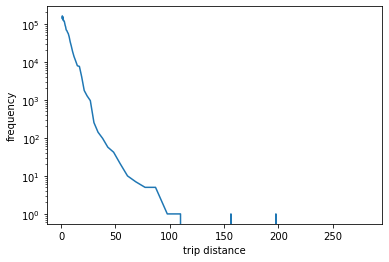

In [49]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
bins, freq = (trips.select(trips['trip_distance'].cast('float'))
                   .rdd
                   .map(lambda x: x.trip_distance)
                   .histogram(np.logspace(0, 2.5).tolist()))
plt.semilogy(bins[:-1], freq)
plt.xlabel('trip distance')
plt.ylabel('frequency');

In [50]:
(trips.withColumn('total_amount', trips.total_amount.cast('float'))
      .groupby('VendorID')
      .sum('total_amount')
      .describe()
      .show())

+-------+------------------+--------------------+
|summary|          VendorID|   sum(total_amount)|
+-------+------------------+--------------------+
|  count|                 2|                   2|
|   mean|               1.5|1.9457178157097057E7|
| stddev|0.7071067811865476|1.7996291301079992E7|
|    min|               1.0|    6731878.54189492|
|    max|               2.0|3.2182477772299197E7|
+-------+------------------+--------------------+



**Problem 2**

Create a function `pudo` that accepts `trips` and returns a triple corresponding to the `PULocationID`, `DOLocationID` and count of the most frequent `PULocationID`-`DOLocationID` pair. Your code should be a single continuous Spark dataframe method call chain.

In [51]:
def pudo(trips):
    return tuple(trips.groupby('PULocationID', 'DOLocationID').count().orderBy('count', ascending=False).first())

In [52]:
# trips.groupby('PULocationID', 'DOLocationID').count().show()

In [53]:
# pdf = pd.read_parquet('/mnt/data/public/nyctaxi/green_2017')
# pdf[(pdf['PULocationID']==7.0) & (pdf['DOLocationID']==7.0)]

In [54]:
from numpy.testing import assert_equal, assert_array_almost_equal
pudo_max = pudo(trips)


In [55]:
pudo_max

(7.0, 7.0, 38832)

**Problem 3**

Create a function `ave_amount` that accepts `trips` and returns a Spark DataFrame with columns `PULocationID` and `mean fare amount` which contains the average fare amount per `PULocationID`.  Sort by `PULocationID`. Your code should be a single continuous Spark dataframe method call chain.

In [56]:
def ave_amount(df_trips):
    return (trips
            .groupby('PULocationID')
            .mean('fare_amount')
            .withColumnRenamed("avg(fare_amount)", "mean fare amount")
            .orderBy('PULocationID'))


In [57]:
mean_fare = ave_amount(trips).toPandas()

assert_equal(len(mean_fare), 255)
assert_equal(mean_fare.columns.tolist(), ['PULocationID', 'mean fare amount'])
assert_equal(mean_fare['PULocationID'].to_numpy()[:10], 
                   [1, 2, 3, 5, 6, 7, 8, 9, 10, 11])
assert_array_almost_equal(
    mean_fare['mean fare amount'].to_numpy()[:10],
    [72.33266667, 61.5       , 17.55557656, 42.83333333, 35.77777778,
     10.08359857, 13.625     , 24.45208845, 19.82410309, 21.73911883])

**Problem 4**

Create a function `pickup` that accepts `trips` and returns a Spark DataFrame with columns `pickup_hour` and `pickup_location`. The column `pickup_hour` is of `StringType` and corresponds to `lpep_pickup_datetime` rounded down to the nearest hour and the column `pickup_location` is the array of unique `PULocationID` for that `pickup_hour` sorted by `PULocationID`. Sort the resulting data frame by `pickup_hour`. Your code should be a single continuous Spark dataframe method call chain.

In [58]:
def pickup(trips):
    from pyspark.sql.functions import to_timestamp, date_trunc, col
    import pyspark.sql.functions as f
    return (trips
            .withColumn('pickup_hour',
                        date_trunc('Hour',
                                   to_timestamp(trips.lpep_pickup_datetime))
                        .cast('string')
                       )
            .groupby('pickup_hour')
            .agg(f.collect_set(col('PULocationID')).alias('pickup_locations'))
            .orderBy('pickup_hour')
            .rdd
            .map(lambda x: (x[0], sorted(x[1])))
            .toDF(['pickup_hour', 'pickup_locations'])
           )

In [59]:
pdf_pickup = pickup(trips).toPandas()
assert_equal(len(pdf_pickup), 2286)
assert_equal(pdf_pickup.columns.tolist(), ['pickup_hour', 'pickup_locations'])
assert_equal(
    pdf_pickup.iloc[:10].to_numpy().tolist(),
    [['2008-12-31 18:00:00', [37]],
     ['2008-12-31 23:00:00', [95, 181, 264]],
     ['2009-01-01 00:00:00', [95, 181, 193, 260]],
     ['2009-01-01 01:00:00', [7, 260]],
     ['2009-01-01 02:00:00', [260]],
     ['2009-01-01 05:00:00', [181]],
     ['2009-01-01 07:00:00', [181]],
     ['2009-01-01 08:00:00', [181]],
     ['2009-01-01 09:00:00', [85, 181]],
     ['2009-01-01 10:00:00', [181]]]
)

## Working with JSON files

We read the tweet JSON files again.

In [60]:
tweets = spark.read.json(
    '/mnt/data/public/twitter/sample/data-1909302*.json.bz2'
)

22/01/31 22:49:48 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


Unlike Pandas dataframes and even popular relational database management systems, Pandas dataframes allow `Struct` types resulting in nested columns.

In [61]:
tweets.printSchema()

root
 |-- contributors: string (nullable = true)
 |-- coordinates: struct (nullable = true)
 |    |-- coordinates: array (nullable = true)
 |    |    |-- element: double (containsNull = true)
 |    |-- type: string (nullable = true)
 |-- created_at: string (nullable = true)
 |-- delete: struct (nullable = true)
 |    |-- status: struct (nullable = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- id_str: string (nullable = true)
 |    |    |-- user_id: long (nullable = true)
 |    |    |-- user_id_str: string (nullable = true)
 |    |-- timestamp_ms: string (nullable = true)
 |-- display_text_range: array (nullable = true)
 |    |-- element: long (containsNull = true)
 |-- entities: struct (nullable = true)
 |    |-- hashtags: array (nullable = true)
 |    |    |-- element: struct (containsNull = true)
 |    |    |    |-- indices: array (nullable = true)
 |    |    |    |    |-- element: long (containsNull = true)
 |    |    |    |-- text: string (nullable = true)
 |    |-

Nested columns can be referred to using dots.

In [62]:
tweets.select('user.screen_name').limit(10).show()

+---------------+
|    screen_name|
+---------------+
|      Felippe2b|
|        alej24e|
|  cc_rodriguezz|
|      Dudu_Wd22|
|         RR2K20|
|komainunokomano|
|           null|
|Hustler76889746|
|Dn_Vitocorleone|
|    mariilerner|
+---------------+



**Problem 5**

Create a function `friendliest` that accepts the Spark DataFrame `df_tweets` and returns a Spark DataFrame with columns `screen_name` and `friends_count` and rows corresponding to the ten unique `screen_name`s with the most `friends_count`. Your code should be a single continuous Spark DataFrame method call chain.

In [63]:
def friendliest(df_tweets):
    return (df_tweets
            .groupby('user.screen_name')
            .max('user.friends_count')
            .withColumnRenamed("max(user.friends_count AS `friends_count`)", 'friends_count')
            .orderBy('friends_count', ascending=False)
            .limit(10)
           )

In [64]:
flist = friendliest(tweets).toPandas()
assert_equal(flist.columns.tolist(), ['screen_name', 'friends_count'])
assert_equal(
    flist.iloc[:5].to_numpy().tolist(),
    [['8W88W', 1102946],
     ['amola12200', 832745],
     ['abl911', 513701],
     ['jilevin', 504085],
     ['p6_96', 387465]]
)

**Problem 6**

Create a function `hashiest` that accepts the Spark DataFrame `df_tweets` and returns a Spark DataFrame with columns `hashtag` and `count`, and rows corresponding to the ten most common hashtags. Sort by decreasing frequency then by hashtag. Your code should be a single Spark DataFrame method call chain.

In [65]:
def hashiest(df_tweets):
    from pyspark.sql.functions import col, size
    from operator import add
    return(df_tweets
           .select('entities.hashtags')
           .where(
               (col('entities.hashtags').isNotNull())
               &(size(col('entities.hashtags'))>0)
           )
           .rdd
           .map(lambda x: [y['text'] for y in x[0]])
           .flatMap(lambda x: x)
           .map(lambda x: (x,1))
           .reduceByKey(add)
           .toDF(['hashtag', 'count'])
           .orderBy('count', ascending=False)
           .limit(10)
    )

In [66]:
hlist = hashiest(tweets).toPandas()
assert_equal(hlist.columns.tolist(), ['hashtag', 'count'])
assert_equal(
    hlist.iloc[:5].to_numpy().tolist(),
    [['PCAs', 413],
     ['MPN', 396],
     ['BTS', 248],
     ['MUNARS', 171],
     ['ARMYSelcaDay', 159]]
)

**Problem 7**

Create a function `geek_tweets` that accepts the Spark data frame `df_tweets` and saves into the parquet file directory `geek-tweets`, partitioned by `created_at`, the tweets that have the case-insensitive word `geek` in the user description. Your code should be a single continuous Spark DataFrame method call chain.

In [67]:
def geek_tweets(df_tweets):
    from pyspark.sql.functions import length, lower
    return (df_tweets
            .where(
                (length(tweets.user.description)!=0) 
                & lower(tweets.user.description).rlike(r'\bgeek\b')
            )
            .write
            .parquet('geek-tweets',
                     mode='overwrite',
                     partitionBy='created_at')
           )

In [68]:
!rm -rf geek-tweets
from glob import glob
geek_tweets(tweets)
assert_equal(len(glob('geek-tweets/created_at=*')), 206)
assert_equal(len(glob('geek-tweets/created_at=*/*')), 206)
assert_equal(len(glob('geek-tweets/created_at=*/*.parquet')), 206)
df_geek_tweets = spark.read.parquet('geek-tweets')
assert_equal(df_geek_tweets.count(), 212)
assert_equal(set(df_geek_tweets.columns), set(tweets.columns))
pdf_geek_tweets = (df_geek_tweets.select('id').orderBy('id').toPandas())
assert_equal(
    pdf_geek_tweets.iloc[:5].to_numpy().tolist(),
    [[1178762263676612608],
     [1178762284635693060],
     [1178762435638915073],
     [1178762485974872065],
     [1178762536306577409]]
)

## Working with Text files

Let's read the Project Gutenberg files again.

In [69]:
texts = spark.read.text('/mnt/data/public/gutenberg/1/1/1/*/*/?????.txt')

In [70]:
texts.show()

+--------------------+
|               value|
+--------------------+
|The Project Guten...|
|Years With The In...|
|                    |
|This eBook is for...|
|almost no restric...|
|re-use it under t...|
|with this eBook o...|
|                    |
|                    |
|Title: Personal M...|
|                    |
|Author: Henry Row...|
|                    |
|Release Date: Feb...|
|                    |
|   Language: English|
|                    |
|Character set enc...|
|                    |
|*** START OF THIS...|
+--------------------+
only showing top 20 rows



We can then list down the most frequent tokens.

In [71]:
from pyspark.sql.functions import split, count

(texts
     .select(explode(split(texts.value, r'\s')).alias('token'))
     .groupby('token')
     .count()
     .orderBy(desc('count'))
     .show())

+-----+------+
|token| count|
+-----+------+
|     |328794|
|  the|288115|
|   of|175109|
|  and|150781|
|   to|127982|
|    a|104434|
|   in| 82712|
| that| 49768|
|  was| 47626|
|    I| 46128|
| with| 39253|
|   is| 38230|
|   he| 37380|
|  his| 36235|
|   as| 34665|
|  for| 34367|
|   it| 32903|
|  had| 27401|
|   be| 26355|
|   on| 25994|
+-----+------+
only showing top 20 rows



If we want to read an entire file as one line, just set `wholetext` to `True`.

In [72]:
(spark.read.text(
    '/mnt/data/public/gutenberg/1/1/1/*/*/?????.txt', 
    wholetext=True)
     .show())

+--------------------+
|               value|
+--------------------+
|The Project Guten...|
|Project Gutenberg...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|Project Gutenberg...|
|Project Gutenberg...|
|The Project Guten...|
|The Project Guten...|
|Project Gutenberg...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|The Project Guten...|
|Project Gutenberg...|
+--------------------+
only showing top 20 rows



In [73]:
from pyspark.sql.functions import input_file_name
(spark.read.text(
    '/mnt/data/public/gutenberg/1/1/1/*/*/?????.txt', 
    wholetext=True)
     .withColumn('filename', input_file_name())
     .show())

+--------------------+--------------------+
|               value|            filename|
+--------------------+--------------------+
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/

In [74]:
from pyspark.sql.functions import input_file_name
(spark.read.text(
    '/mnt/data/public/gutenberg/1/1/1/*/*/?????.txt', 
    wholetext=True)
     .select('value', input_file_name().alias('filename'))
     .show())

+--------------------+--------------------+
|               value|            filename|
+--------------------+--------------------+
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|The Project Guten...|file:/mnt/data/pu...|
|Project Gutenberg...|file:/mnt/

**Problem 8**

Create a function `count_tokens` that accepts a list of Project Gutenberg filepaths `fpaths` and returns a Spark DataFrame with columns `id` and `tokens` sorted by `id`. The `id` column corresponds to the id of the book and the `value` column corresponds to the number of tokens in each book, including headers and footers. A token is defined as a sequence of non-whitespace characters. Your code should be a single continuous Spark DataFrame method call chain.

In [75]:
def count_tokens(fpaths):
    from pyspark.sql.functions import input_file_name, col, split, trim, size, regexp_extract
    return(spark.read.text(fpaths, wholetext=True)
           .select(input_file_name().alias('id'), col('value').alias('tokens'))
           .withColumn('tokens', size(split(trim(col('tokens')),  r'\s+'))-1)
           .withColumn('id', regexp_extract('id', r'.+/(\d+).txt', 1))
           .orderBy('id')
          )

In [76]:
pdf_token_counts = count_tokens(
    '/mnt/data/public/gutenberg/1/1/1/*/*/?????.txt').toPandas()
assert_equal(pdf_token_counts.columns.tolist(), ['id', 'tokens'])
assert_equal(
    pdf_token_counts.iloc[:10].to_numpy().tolist(),
    [['11100', 243729],
     ['11101', 36479],
     ['11102', 44876],
     ['11103', 89587],
     ['11104', 53843],
     ['11105', 8506],
     ['11106', 115056],
     ['11107', 14580],
     ['11108', 35843],
     ['11109', 16937]]
)

**Problem 9**

Create a function `count_love` that reads a Spark DataFrame `df_texts` of strings and returns the number of occurences of the word `love` (case-insensitive, bounded by non-word characters) in all of the strings. Your code should be a single continuous Spark DataFrame method call chain.

In [77]:
def count_love(texts):
    import re
    from operator import add
    return (texts
            .rdd
            .map(lambda x: len(re.findall(r'\blove\b', x['value'], re.I)))
            .reduce(add))

In [78]:
love_count = count_love(texts)

In [79]:
love_count

2477